# SIR dynamics: fit the scales, using different infectivity matrices

[Index](0-index.ipynb)

We fit the scale parameter every day so as to minimize the sum of square errors with local reports of infection using:
* the SafeGraph derived infectivity matrix;
* a uniform infectivity matrix;
* the average of optimal infectivity matrices (see [7-LSQ_fit_optimal_betamat](7-LSQ_fit_optimal_betamat.ipynb));
* the SafeGraph derived infectivity matrix truncated to close geographical distances.

The fitting is performed with the script [5-LSQ_fit_scales_exec](5-LSQ_fit_scales_exec.py). The analysis is performed in this notebook.

## Imports and global variables

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
from pathlib import Path
import os,sys
import numpy as np
import pandas as pd
import datetime
from dateutil.relativedelta import relativedelta
import scipy
from scipy.integrate import solve_ivp
from scipy.optimize import minimize, minimize_scalar, Bounds, bracket
import scipy.stats as sst

import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
import matplotlib.colors as mco
import matplotlib.gridspec as mgs
import matplotlib.cm as cm
from matplotlib.gridspec import GridSpec
from matplotlib import animation
plt.rcParams['svg.fonttype'] = 'none'

from IPython.display import HTML
from IPython.display import Image

In [3]:
sys.path.append(str(Path('..') / 'code'))

In [4]:
from functions import get_infectivity_matrix, func_sir_dX, sir_SI_to_X, sir_X_to_SI, func_sir_dV, guess_scale, get_dTs, plot_scatter

In [5]:
resdir = Path('../results/')
if not resdir.is_dir():
    raise ValueError('No results directory!')

In [6]:
resfile = resdir / 'safegraph_analysis.hdf5'
complevel=7
complib='zlib'
with pd.HDFStore(resfile, complevel=complevel, complib=complib) as store:
    print(f"File {resfile.stem} has {len(store.keys())} entries.")

File safegraph_analysis has 2188 entries.


In [7]:
figdir = Path('../figures') / '5-LSQ_fit_scales'
if not figdir.is_dir():
    figdir.mkdir(parents=True, exist_ok=True)

In [8]:
colors = ['darkblue', 'darkgreen', 'orange', 'magenta']
labels = ["safegraph", "uniform", "optimal", "distance_trunc"]

## Global variables and other quantities

### Global variables

In [9]:
gamma = 1/10.
ti = '2020-03-01'
# tf = '2020-09-01'
tf = '2021-02-16'

tfmt = '%Y-%m-%d'
ti = datetime.datetime.strptime(ti, tfmt)
tf = datetime.datetime.strptime(tf, tfmt)

exts = ['.png', '.svg']

### Load clusters to get population

In [10]:
key = "/clustering/clusters"
with pd.HDFStore(resfile, complevel=complevel, complib=complib) as store:
    clusters = store[key]
# clusters = pd.read_hdf(resfile, key)
N = len(clusters)
print(f"N = {N}")
clusters

N = 1024


,leaves,X,Y,cbg_clusters,population,mobile_count
index,,,,,,
0,746,-65.794825,18.277415,"[720531504003, 720531501044, 720531505001, 720...",390728,8705.198547
1,458,-66.083320,18.131576,"[720572702011, 720572703004, 720572705001, 720...",488287,10942.351090
2,873,-66.079340,18.396328,"[720210307001, 720210310113, 720210316223, 720...",1011530,28389.915254
3,8,-66.344566,18.363775,"[720399559001, 720399556001, 720399557001, 720...",425126,9988.154964
4,641,-66.582628,18.044742,"[721130724005, 721130727011, 721130727012, 721...",354598,12057.116223
...,...,...,...,...,...,...
1019,911,-158.026269,21.423245,"[150030078092, 150030078102, 150030099044, 150...",459209,22780.496368
1020,7,-157.813184,21.329035,"[150090318011, 150099900000, 150030047001, 150...",529047,21868.060533
1021,392,-156.517054,20.867763,"[150090311032, 150090304042, 150090309034, 150...",161290,7878.004843


In [11]:
population = clusters['population'].to_numpy()
population_inv = np.zeros(population.shape, dtype=np.float_)
idx = population > 0.
population_inv[idx] = 1./population[idx]

### Load CSSEGI data

In [12]:
path = '/clustering/cssegi'
with pd.HDFStore(resfile, complevel=complevel, complib=complib) as store:
    df_cssegi = store[path]

times = df_cssegi.index
idx = (times >= ti) & (times <= tf)
df_cssegi.drop(index=times[~idx], inplace=True)
times = df_cssegi.index.to_pydatetime().tolist()
df_cssegi

index,0,1,2,3,4,5,6,7,8,9,...,1014,1015,1016,1017,1018,1019,1020,1021,1022,1023
2020-03-01,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-03-02,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-03-03,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-03-04,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-03-05,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-02-12,0,0,0,0,0,0,0,0,1215,239,...,0,0,397,0,181,21712,0,2540,2239,0
2021-02-13,0,0,0,0,0,0,0,0,1221,241,...,0,0,397,0,181,21758,0,2549,2241,0
2021-02-14,0,0,0,0,0,0,0,0,1227,241,...,0,0,397,0,181,21794,0,2553,2244,0
2021-02-15,0,0,0,0,0,0,0,0,1231,241,...,0,0,397,0,181,21817,0,2561,2244,0


In [13]:
omega_real = df_cssegi.to_numpy().astype('float64')
domega_real = np.diff(omega_real, axis=0)
domega_real = np.concatenate([omega_real[0].reshape(1,-1), domega_real], axis=0)

In [14]:
# compute the real epidemic sizes per community through time
Ts_real = np.einsum('ta,a->ta', omega_real, population_inv)
Ss_real = 1. - Ts_real
Ss_real[~(Ss_real > 0.)] = np.finfo(np.float64).resolution
dTs_real = np.einsum('ta,a->ta', domega_real, population_inv)
T_tot_real = np.einsum('ta,a->t', Ts_real, population) / np.sum(population)
S_tot_real = np.einsum('ta,a->t', Ss_real, population) / np.sum(population)
dT_tot_real = np.einsum('ta,a->t', dTs_real, population) / np.sum(population)

Show the total epidemic size from real data

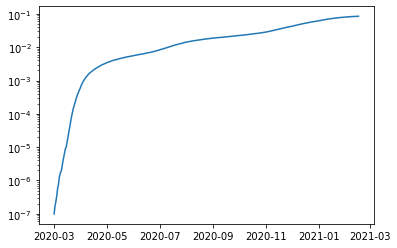

In [15]:
plt.plot(times, T_tot_real)
plt.gca().set_yscale('log')

Show the initial condition

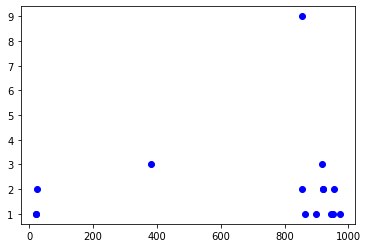

In [16]:
X = clusters.index.to_numpy()
Y = np.einsum('ta,a->ta', Ts_real, population)[0]
idx = Y > 0
plt.plot(X[idx],Y[idx], 'bo')

Define the V-vector

In [17]:
Vs_real = -np.log(Ss_real/Ss_real[0])

## Integrate the dynamics based on the (S,I) variables

### SafeGraph

In [18]:
with pd.HDFStore(resfile, complevel=complevel, complib=complib) as store:
    path = Path('/fit') / 'scales' / 'sifit_safegraph' / 'infectivity_matrices'
    mykey = str(path / times[0].strftime(tfmt))
    L_sg = store[mykey].to_numpy().astype('float64')
    
    path = Path('/fit') / 'scales' / 'sifit_safegraph' / 'result'
    mykey = str(path / 'susceptible')
    Ss_si_sg = store[mykey].to_numpy().astype('float64')
    
    mykey = str(path / 'infected')
    Is_si_sg = store[mykey].to_numpy().astype('float64')
    
    mykey = str(path / 'nu')
    Vs_si_sg = store[mykey].to_numpy().astype('float64')
    
    mykey = str(path / 'scales')
    scales_si_sg = store[mykey].to_numpy().astype('float64')

In [19]:
dTs_si_sg, dT_tot_si_sg = get_dTs(Ss_si_sg, population)

In [20]:
Xs = np.einsum('ta,a->ta', 1-Ss_real, population)
Ys = np.einsum('ta,a->ta', 1-Ss_si_sg, population)
idump = 10
vmin = 1.0e0
vmax = 1.0e6
xlabel = "$T_a^{real}$"
ylabel = "$T_a$"
fname = 'T_model_vs_real_si_sg'
fpaths = [figdir / (fname + ext) for ext in exts]

plot_scatter(times, Xs, Ys, idump=idump, vmin=vmin,vmax=vmax, \
                 xlabel=xlabel, ylabel=ylabel, logscale=True, fpaths=fpaths)

Written file: ../figures/5-LSQ_fit_scales/T_model_vs_real_si_sg.png
Written file: ../figures/5-LSQ_fit_scales/T_model_vs_real_si_sg.svg


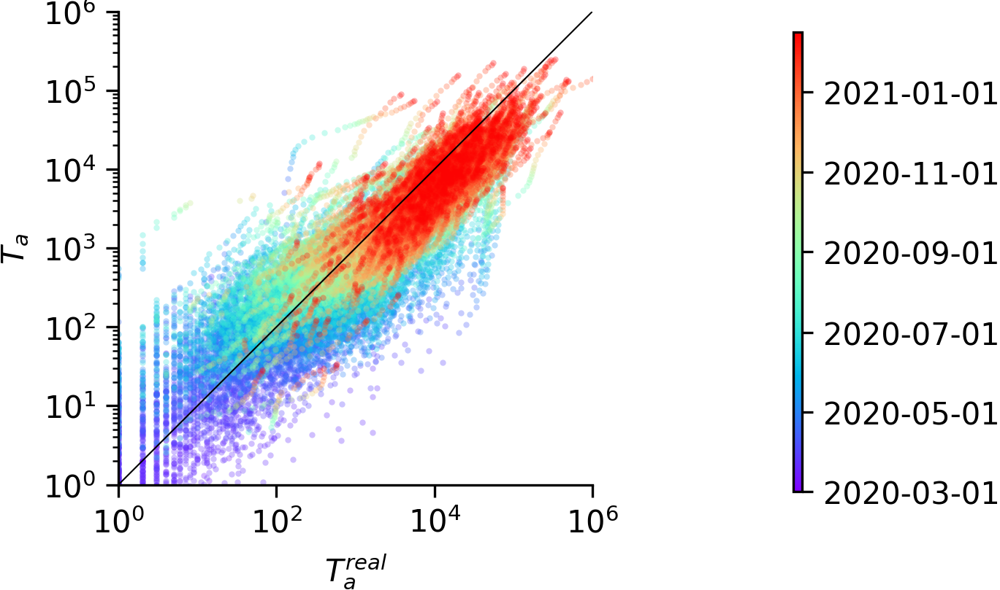

In [21]:
filepath = figdir / (fname + '.png')
Image(filename=filepath, width=4./3*360)

In [22]:
figsize = None
dpi = 300
idump = 10
xlabel = "$T_a^{real}$"
ylabel = "$T_a$"
alpha = 1.
a = 10
vmin = 1.0e0
vmax = 1.0e6

outputdir = figdir / 'safegraph' / 'time_T_model_vs_real_sifit'
if not outputdir.is_dir():
    outputdir.mkdir(parents=True, exist_ok=True)

Xs = np.einsum('ta,a->ta', 1-Ss_real, population)
Ys = np.einsum('ta,a->ta', 1-Ss_si_sg, population)
    
for i in range(len(times)):
    fname = times[i].strftime(tfmt)
    fpaths = [outputdir / (fname + ext) for ext in exts]
    
    plot_scatter(times[i:i+1], Xs[i:i+1], Ys[i:i+1], idump=idump, vmin=vmin,vmax=vmax, alpha=alpha, \
                     xlabel=xlabel, ylabel=ylabel, logscale=True, fpaths=fpaths, dpi=dpi, figsize=figsize, verbose=False)

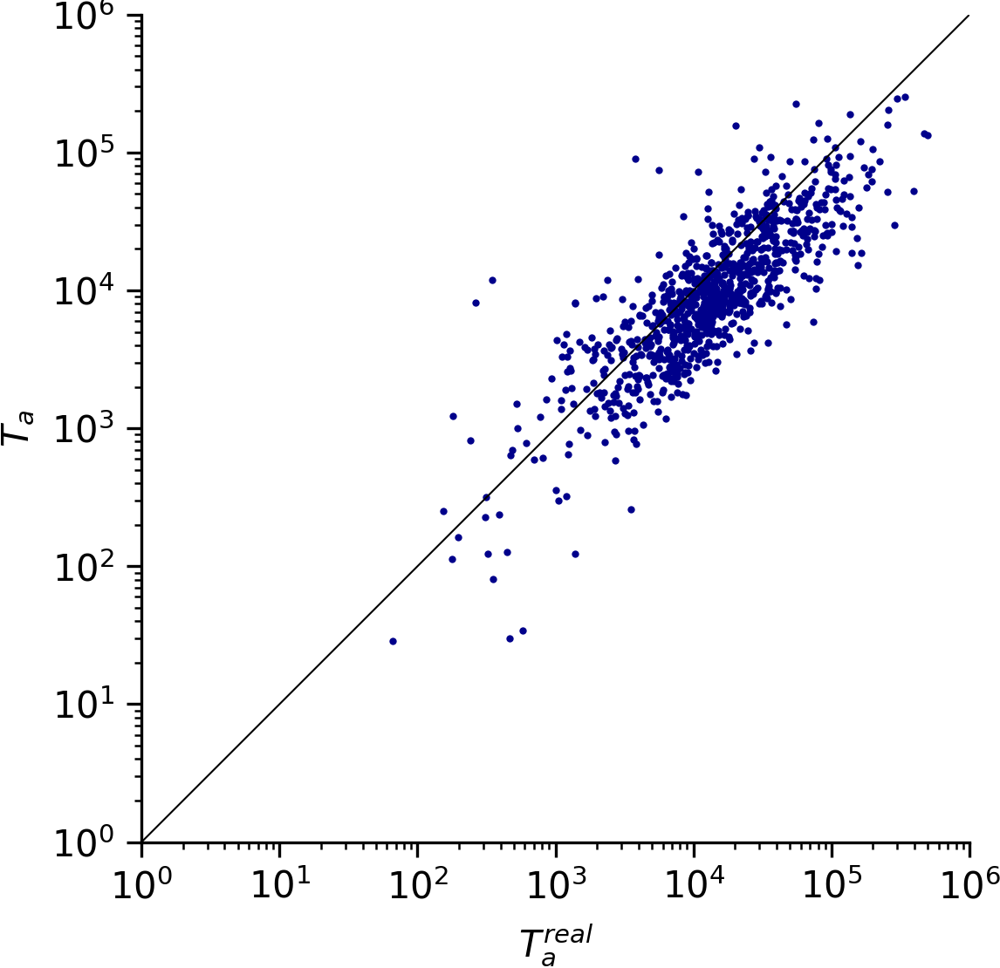

In [23]:
fname = times[i].strftime(tfmt)
filepath = outputdir / (fname + '.png')
Image(filename=filepath, width=4./3*360)

In [24]:
Xs = Vs_real
Ys = Vs_si_sg
idump = 10
vmin = 1.0e-5
vmax = 2.0e-1
xlabel = "$\\nu_a^{real}$"
ylabel = "$\\nu_a$"
fname = 'nu_model_vs_real_si_sg'
fpaths = [figdir / (fname + ext) for ext in exts]

plot_scatter(times, Xs, Ys, idump=idump, vmin=vmin,vmax=vmax, \
                 xlabel=xlabel, ylabel=ylabel, logscale=False, fpaths=fpaths)

Written file: ../figures/5-LSQ_fit_scales/nu_model_vs_real_si_sg.png
Written file: ../figures/5-LSQ_fit_scales/nu_model_vs_real_si_sg.svg


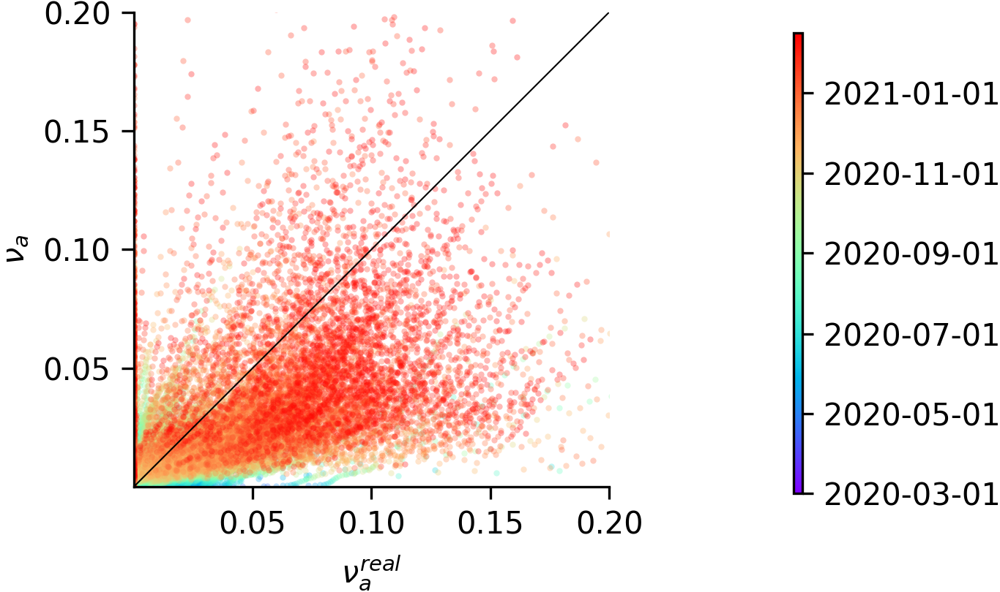

In [25]:
filepath = figdir / (fname + '.png')
Image(filename=filepath, width=4./3*360)

In [26]:
figsize = (4,3)
dpi = 300
idump = 10
# vmin = 1.0e-5
# vmax = 2.0e-1
vmin = None
vmax = None
xlabel = "$\\nu_a^{real}$"
ylabel = "$\\nu_a$"
alpha = 1.
a = 10

outputdir = figdir / 'safegraph' / 'time_nu_model_vs_real_sifit'
if not outputdir.is_dir():
    outputdir.mkdir(parents=True, exist_ok=True)

Xs = Vs_real
Ys = Vs_si_sg
    
for i in range(len(times)):
    fname = times[i].strftime(tfmt)
    fpaths = [outputdir / (fname + ext) for ext in exts]
    
    vmin, vmax = (np.percentile(Ys[i], 0.5*a), np.percentile(Ys[i], (100-0.5*a)))
    plot_scatter(times[i:i+1], Xs[i:i+1], Ys[i:i+1], idump=idump, vmin=vmin,vmax=vmax, alpha=alpha, \
                     xlabel=xlabel, ylabel=ylabel, logscale=False, fpaths=fpaths, dpi=dpi, figsize=figsize, verbose=False)

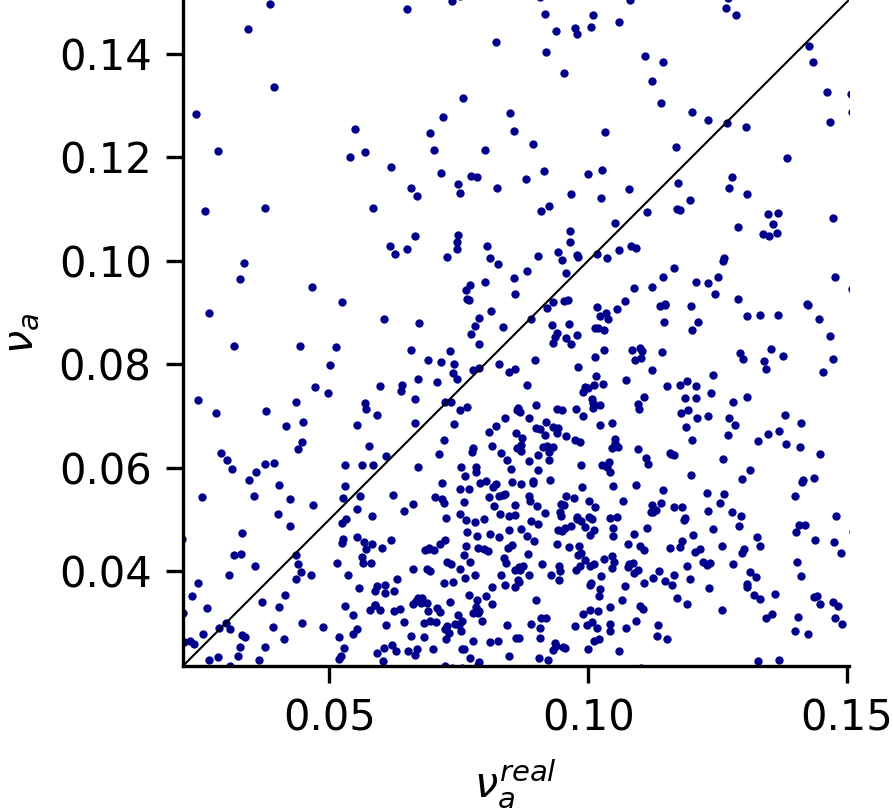

In [27]:
fname = times[i].strftime(tfmt)
filepath = outputdir / (fname + '.png')
Image(filename=filepath, width=4./3*360)

### Uniform infectivity matrix

In [28]:
with pd.HDFStore(resfile, complevel=complevel, complib=complib) as store:
    path = Path('/fit') / 'scales' / 'sifit_uniform' / 'infectivity_matrices'
    mykey = str(path / times[0].strftime(tfmt))
    L_unif = store[mykey].to_numpy().astype('float64')
    
    path = Path('/fit') / 'scales' / 'sifit_uniform' / 'result'
    mykey = str(path / 'susceptible')
    Ss_si_unif = store[mykey].to_numpy().astype('float64')
    
    mykey = str(path / 'infected')
    Is_si_unif = store[mykey].to_numpy().astype('float64')
    
    mykey = str(path / 'nu')
    Vs_si_unif = store[mykey].to_numpy().astype('float64')
    
    mykey = str(path / 'scales')
    scales_si_unif = store[mykey].to_numpy().astype('float64')

In [29]:
dTs_si_unif, dT_tot_si_unif = get_dTs(Ss_si_unif, population)

In [30]:
Xs = np.einsum('ta,a->ta', 1-Ss_real, population)
Ys = np.einsum('ta,a->ta', 1-Ss_si_unif, population)
idump = 10
vmin = 1.0e0
vmax = 1.0e6
xlabel = "$T_a^{real}$"
ylabel = "$T_a$"
fname = 'T_model_vs_real_si_unif'
fpaths = [figdir / (fname + ext) for ext in exts]

plot_scatter(times, Xs, Ys, idump=idump, vmin=vmin,vmax=vmax, \
                 xlabel=xlabel, ylabel=ylabel, logscale=True, fpaths=fpaths)

Written file: ../figures/5-LSQ_fit_scales/T_model_vs_real_si_unif.png
Written file: ../figures/5-LSQ_fit_scales/T_model_vs_real_si_unif.svg


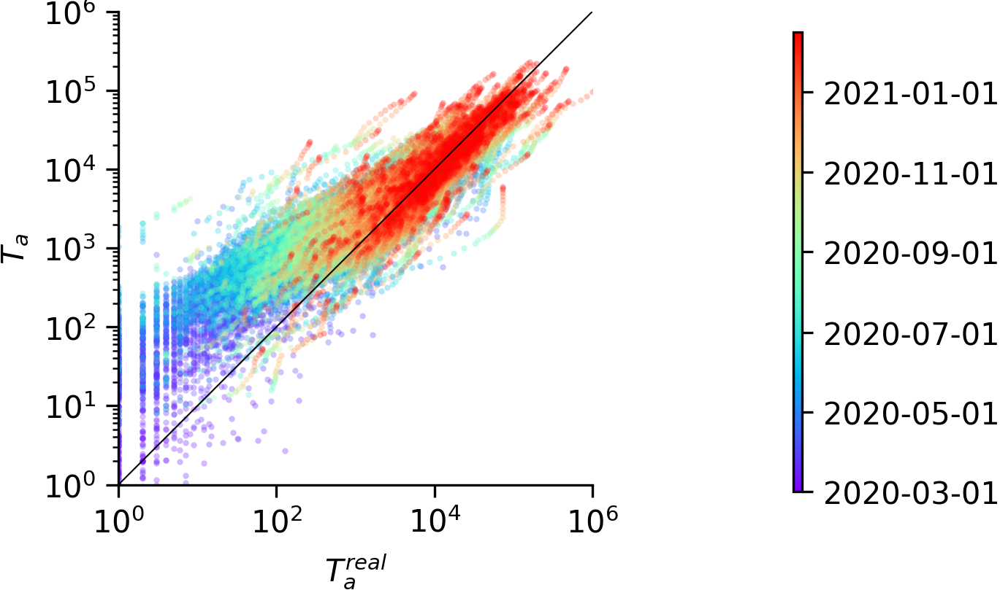

In [31]:
filepath = figdir / (fname + '.png')
Image(filename=filepath, width=4./3*360)

In [32]:
figsize = None
dpi = 300
idump = 10
xlabel = "$T_a^{real}$"
ylabel = "$T_a$"
alpha = 1.
a = 10
vmin = 1.0e0
vmax = 1.0e6

outputdir = figdir / 'uniform' / 'time_T_model_vs_real_sifit'
if not outputdir.is_dir():
    outputdir.mkdir(parents=True, exist_ok=True)

Xs = np.einsum('ta,a->ta', 1-Ss_real, population)
Ys = np.einsum('ta,a->ta', 1-Ss_si_unif, population)
    
for i in range(len(times)):
    fname = times[i].strftime(tfmt)
    fpaths = [outputdir / (fname + ext) for ext in exts]
    
    plot_scatter(times[i:i+1], Xs[i:i+1], Ys[i:i+1], idump=idump, vmin=vmin,vmax=vmax, alpha=alpha, \
                     xlabel=xlabel, ylabel=ylabel, logscale=True, fpaths=fpaths, dpi=dpi, figsize=figsize, verbose=False)

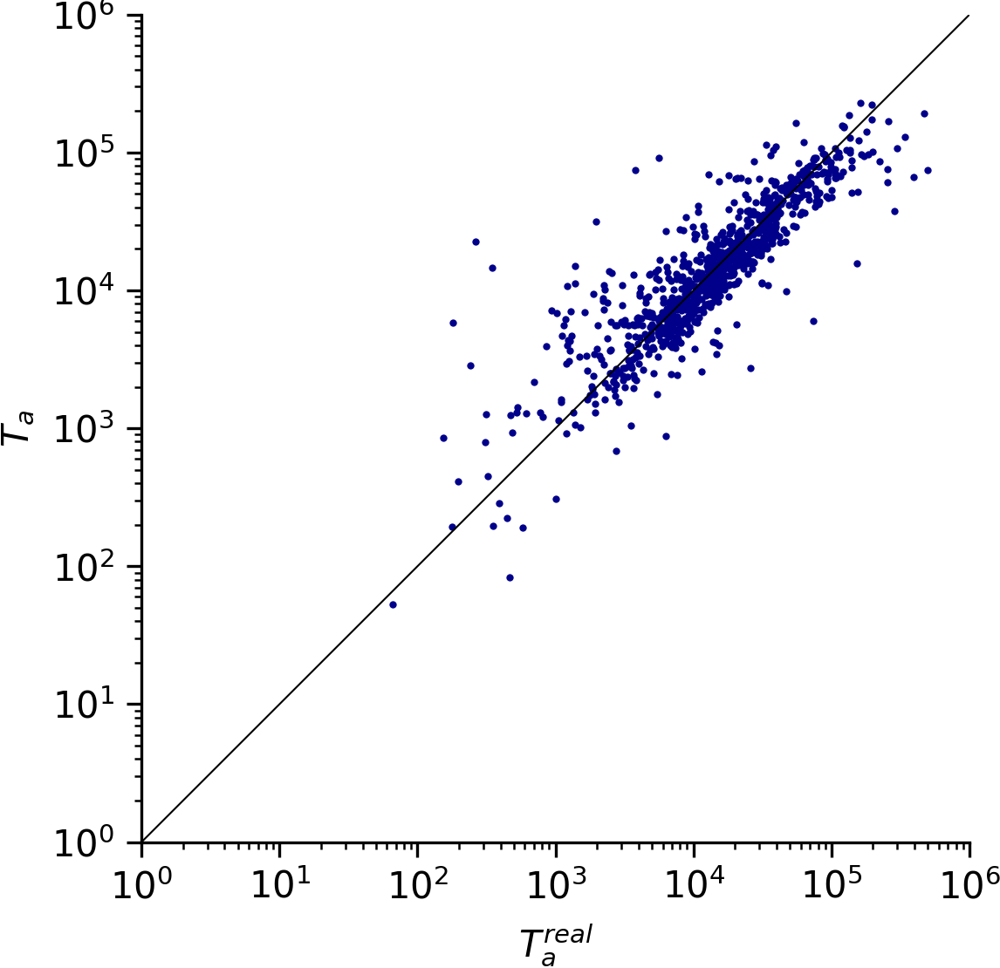

In [33]:
fname = times[i].strftime(tfmt)
filepath = outputdir / (fname + '.png')
Image(filename=filepath, width=4./3*360)

In [34]:
Xs = Vs_real
Ys = Vs_si_unif
idump = 10
vmin = 1.0e-5
vmax = 2.0e-1
xlabel = "$\\nu_a^{real}$"
ylabel = "$\\nu_a$"
fname = 'nu_model_vs_real_si_unif'
fpaths = [figdir / (fname + ext) for ext in exts]

plot_scatter(times, Xs, Ys, idump=idump, vmin=vmin,vmax=vmax, \
                 xlabel=xlabel, ylabel=ylabel, logscale=False, fpaths=fpaths)

Written file: ../figures/5-LSQ_fit_scales/nu_model_vs_real_si_unif.png
Written file: ../figures/5-LSQ_fit_scales/nu_model_vs_real_si_unif.svg


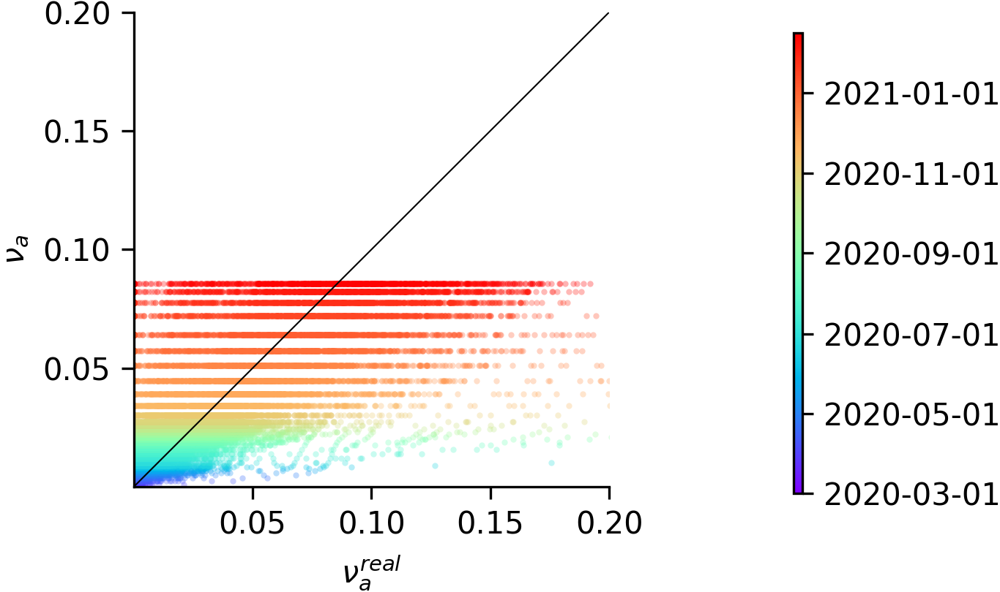

In [35]:
filepath = figdir / (fname + '.png')
Image(filename=filepath, width=4./3*360)

In [36]:
figsize = (4,3)
dpi = 300
idump = 10
# vmin = 1.0e-5
# vmax = 2.0e-1
vmin = None
vmax = None
xlabel = "$\\nu_a^{real}$"
ylabel = "$\\nu_a$"
alpha = 1.
a = 10

outputdir = figdir / 'uniform' / 'time_nu_model_vs_real_sifit'
if not outputdir.is_dir():
    outputdir.mkdir(parents=True, exist_ok=True)

Xs = Vs_real
Ys = Vs_si_unif
    
for i in range(len(times)):
    fname = times[i].strftime(tfmt)
    fpaths = [outputdir / (fname + ext) for ext in exts]
    
    vmin, vmax = (np.percentile(Ys[i], 0.5*a), np.percentile(Ys[i], (100-0.5*a)))
    plot_scatter(times[i:i+1], Xs[i:i+1], Ys[i:i+1], idump=idump, vmin=vmin,vmax=vmax, alpha=alpha, \
                     xlabel=xlabel, ylabel=ylabel, logscale=False, fpaths=fpaths, dpi=dpi, figsize=figsize, verbose=False)

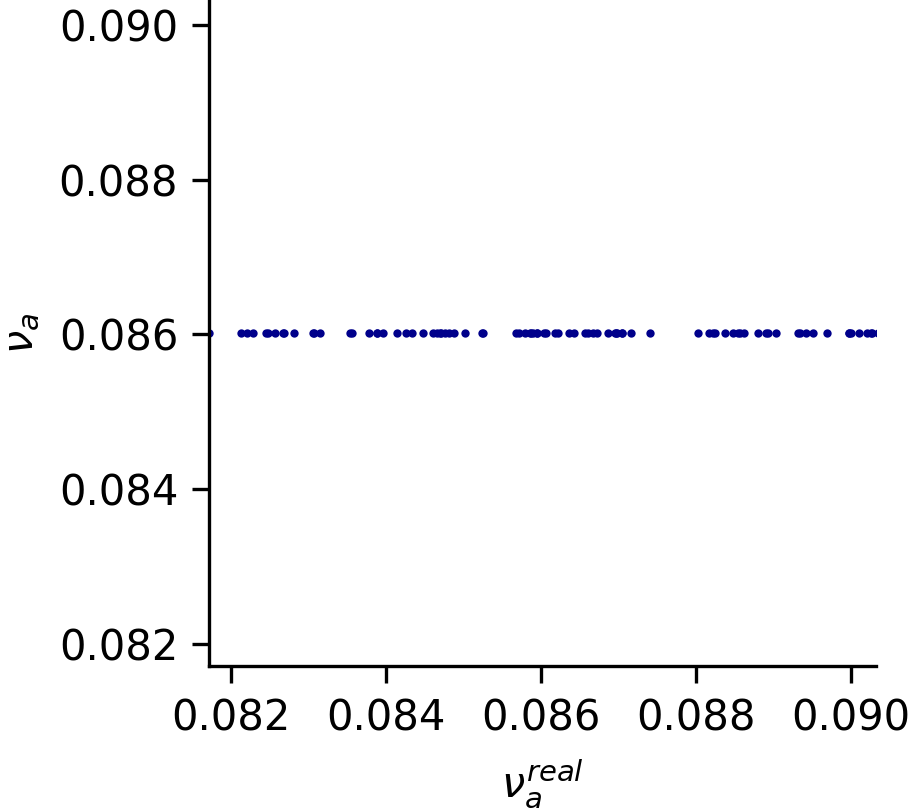

In [37]:
fname = times[i].strftime(tfmt)
filepath = outputdir / (fname + '.png')
Image(filename=filepath, width=4./3*360)

### Optimal infectivity matrix

In [38]:
with pd.HDFStore(resfile, complevel=complevel, complib=complib) as store:
    path = Path('/fit') / 'scales' / 'sifit_optimal' / 'infectivity_matrices'
    mykey = str(path / times[0].strftime(tfmt))
    L_opt = store[mykey].to_numpy().astype('float64')
    
    path = Path('/fit') / 'scales' / 'sifit_optimal' / 'result'
    mykey = str(path / 'susceptible')
    Ss_si_opt = store[mykey].to_numpy().astype('float64')
    
    mykey = str(path / 'infected')
    Is_si_opt = store[mykey].to_numpy().astype('float64')
    
    mykey = str(path / 'nu')
    Vs_si_opt = store[mykey].to_numpy().astype('float64')
    
    mykey = str(path / 'scales')
    scales_si_opt = store[mykey].to_numpy().astype('float64')

In [39]:
dTs_si_opt, dT_tot_si_opt = get_dTs(Ss_si_opt, population)

In [40]:
Xs = np.einsum('ta,a->ta', 1-Ss_real, population)
Ys = np.einsum('ta,a->ta', 1-Ss_si_opt, population)
idump = 10
vmin = 1.0e0
vmax = 1.0e6
xlabel = "$T_a^{real}$"
ylabel = "$T_a$"
fname = 'T_model_vs_real_si_opt'
fpaths = [figdir / (fname + ext) for ext in exts]

plot_scatter(times, Xs, Ys, idump=idump, vmin=vmin,vmax=vmax, \
                 xlabel=xlabel, ylabel=ylabel, logscale=True, fpaths=fpaths)

Written file: ../figures/5-LSQ_fit_scales/T_model_vs_real_si_opt.png
Written file: ../figures/5-LSQ_fit_scales/T_model_vs_real_si_opt.svg


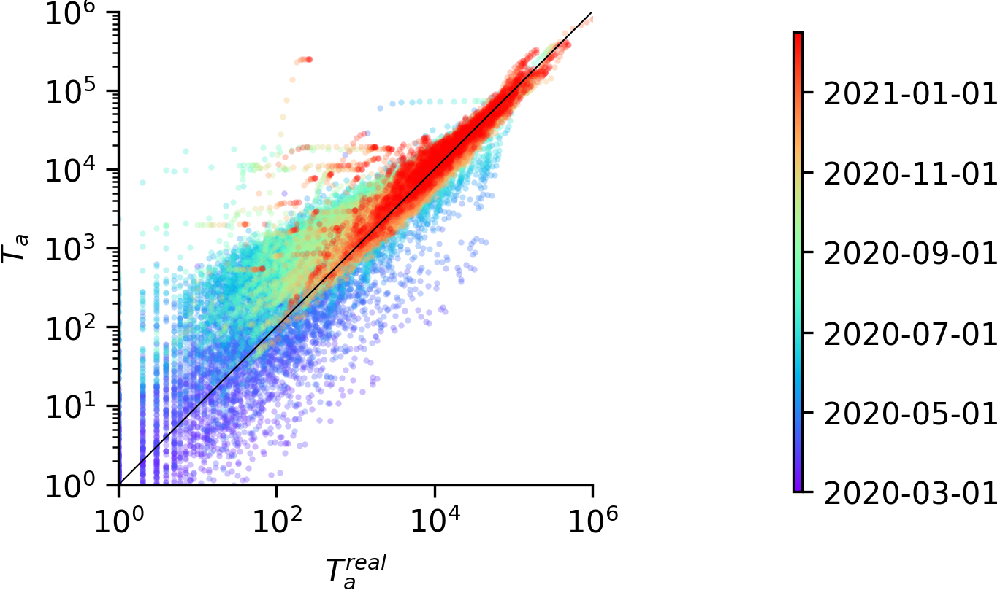

In [41]:
filepath = figdir / (fname + '.png')
Image(filename=filepath, width=4./3*360)

In [42]:
figsize = None
dpi = 300
idump = 10
xlabel = "$T_a^{real}$"
ylabel = "$T_a$"
alpha = 1.
a = 10
vmin = 1.0e0
vmax = 1.0e6

outputdir = figdir / 'optimal' / 'time_T_model_vs_real_sifit'
if not outputdir.is_dir():
    outputdir.mkdir(parents=True, exist_ok=True)

Xs = np.einsum('ta,a->ta', 1-Ss_real, population)
Ys = np.einsum('ta,a->ta', 1-Ss_si_opt, population)
    
for i in range(len(times)):
    fname = times[i].strftime(tfmt)
    fpaths = [outputdir / (fname + ext) for ext in exts]
    
    plot_scatter(times[i:i+1], Xs[i:i+1], Ys[i:i+1], idump=idump, vmin=vmin,vmax=vmax, alpha=alpha, \
                     xlabel=xlabel, ylabel=ylabel, logscale=True, fpaths=fpaths, dpi=dpi, figsize=figsize, verbose=False)

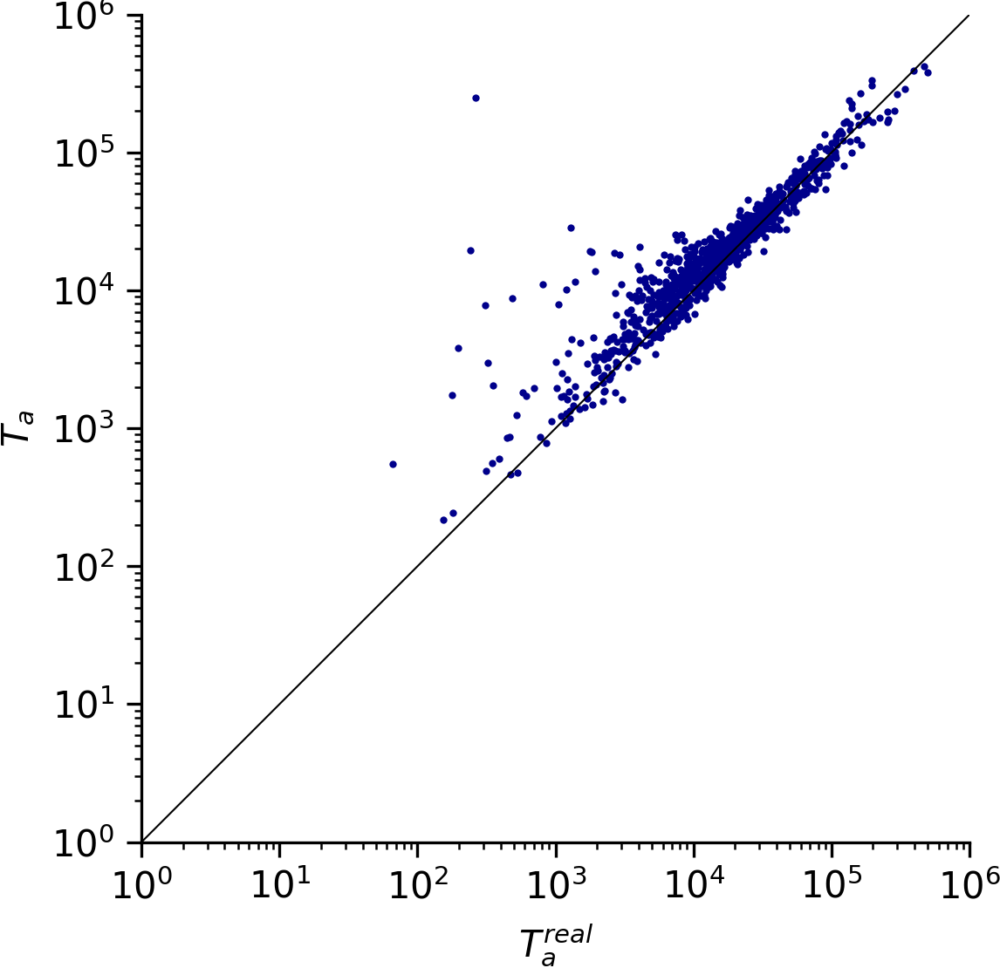

In [43]:
fname = times[i].strftime(tfmt)
filepath = outputdir / (fname + '.png')
Image(filename=filepath, width=4./3*360)

In [44]:
Xs = Vs_real
Ys = Vs_si_opt
idump = 10
vmin = 1.0e-5
vmax = 2.0e-1
xlabel = "$\\nu_a^{real}$"
ylabel = "$\\nu_a$"
fname = 'nu_model_vs_real_si_opt'
fpaths = [figdir / (fname + ext) for ext in exts]

plot_scatter(times, Xs, Ys, idump=idump, vmin=vmin,vmax=vmax, \
                 xlabel=xlabel, ylabel=ylabel, logscale=False, fpaths=fpaths)

Written file: ../figures/5-LSQ_fit_scales/nu_model_vs_real_si_opt.png
Written file: ../figures/5-LSQ_fit_scales/nu_model_vs_real_si_opt.svg


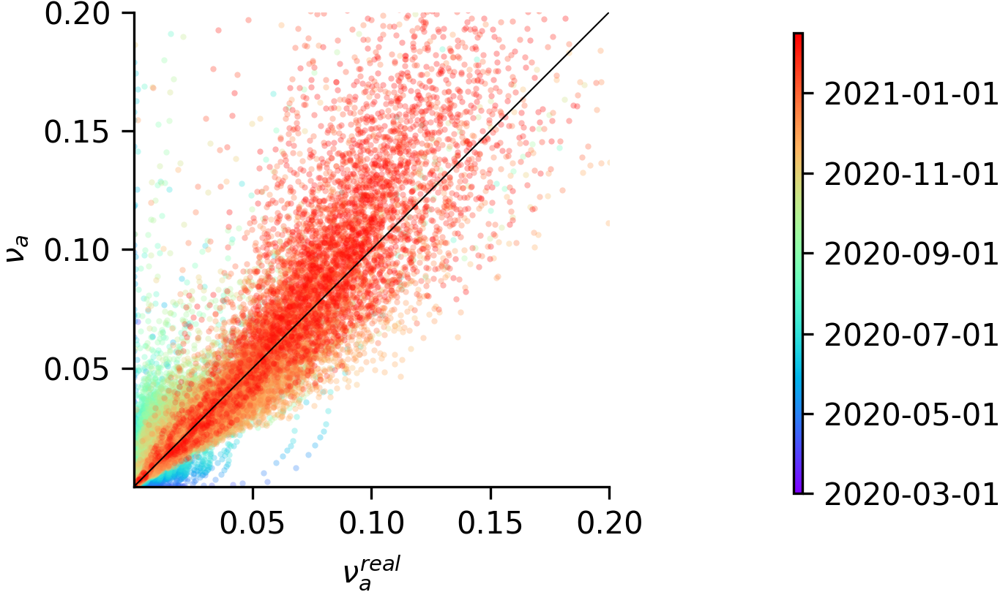

In [45]:
filepath = figdir / (fname + '.png')
Image(filename=filepath, width=4./3*360)

In [46]:
figsize = (4,3)
dpi = 300
idump = 10
# vmin = 1.0e-5
# vmax = 2.0e-1
vmin = None
vmax = None
xlabel = "$\\nu_a^{real}$"
ylabel = "$\\nu_a$"
alpha = 1.
a = 10

outputdir = figdir / 'optimal' / 'time_nu_model_vs_real_sifit'
if not outputdir.is_dir():
    outputdir.mkdir(parents=True, exist_ok=True)

Xs = Vs_real
Ys = Vs_si_opt
    
for i in range(len(times)):
    fname = times[i].strftime(tfmt)
    fpaths = [outputdir / (fname + ext) for ext in exts]
    
    vmin, vmax = (np.percentile(Ys[i], 0.5*a), np.percentile(Ys[i], (100-0.5*a)))
    plot_scatter(times[i:i+1], Xs[i:i+1], Ys[i:i+1], idump=idump, vmin=vmin,vmax=vmax, alpha=alpha, \
                     xlabel=xlabel, ylabel=ylabel, logscale=False, fpaths=fpaths, dpi=dpi, figsize=figsize, verbose=False)

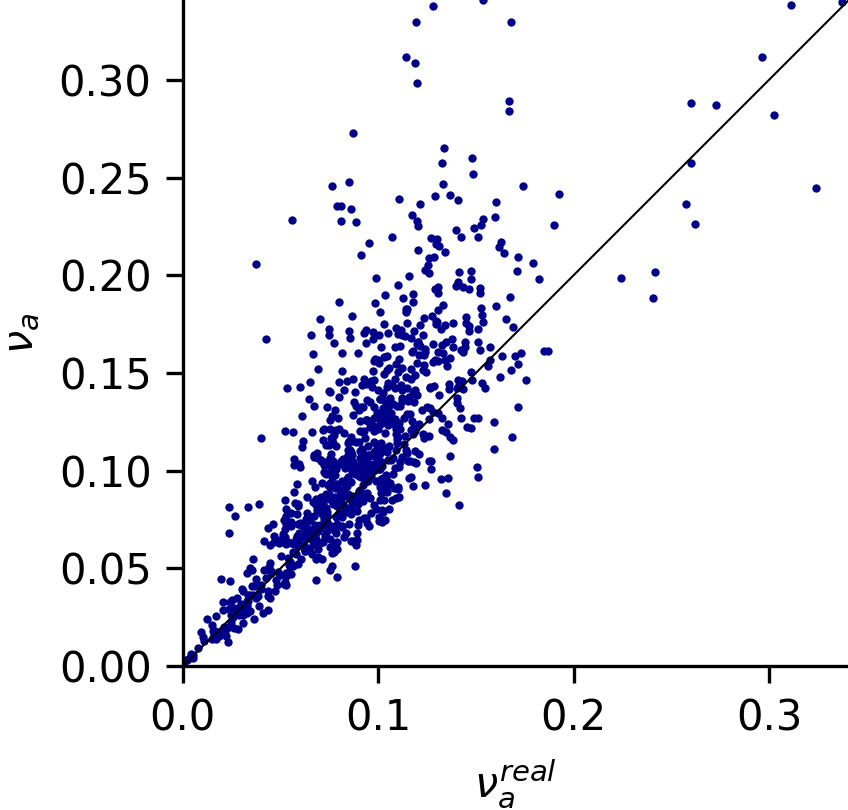

In [47]:
fname = times[i].strftime(tfmt)
filepath = outputdir / (fname + '.png')
Image(filename=filepath, width=4./3*360)

### Distance truncated

In [48]:
with pd.HDFStore(resfile, complevel=complevel, complib=complib) as store:
    path = Path('/fit') / 'scales' / 'sifit_distance_trunc_400km' / 'infectivity_matrices'
    mykey = str(path / times[0].strftime(tfmt))
    L_trunc = store[mykey].to_numpy().astype('float64')
    
    path = Path('/fit') / 'scales' / 'sifit_distance_trunc_400km' / 'result'
    mykey = str(path / 'susceptible')
    Ss_si_trunc = store[mykey].to_numpy().astype('float64')
    
    mykey = str(path / 'infected')
    Is_si_trunc = store[mykey].to_numpy().astype('float64')
    
    mykey = str(path / 'nu')
    Vs_si_trunc = store[mykey].to_numpy().astype('float64')
    
    mykey = str(path / 'scales')
    scales_si_trunc = store[mykey].to_numpy().astype('float64')

In [49]:
dTs_si_trunc, dT_tot_si_trunc = get_dTs(Ss_si_trunc, population)

In [50]:
Xs = np.einsum('ta,a->ta', 1-Ss_real, population)
Ys = np.einsum('ta,a->ta', 1-Ss_si_trunc, population)
idump = 10
vmin = 1.0e0
vmax = 1.0e6
xlabel = "$T_a^{real}$"
ylabel = "$T_a$"
fname = 'T_model_vs_real_si_trunc'
fpaths = [figdir / (fname + ext) for ext in exts]

plot_scatter(times, Xs, Ys, idump=idump, vmin=vmin,vmax=vmax, \
                 xlabel=xlabel, ylabel=ylabel, logscale=True, fpaths=fpaths)

Written file: ../figures/5-LSQ_fit_scales/T_model_vs_real_si_trunc.png
Written file: ../figures/5-LSQ_fit_scales/T_model_vs_real_si_trunc.svg


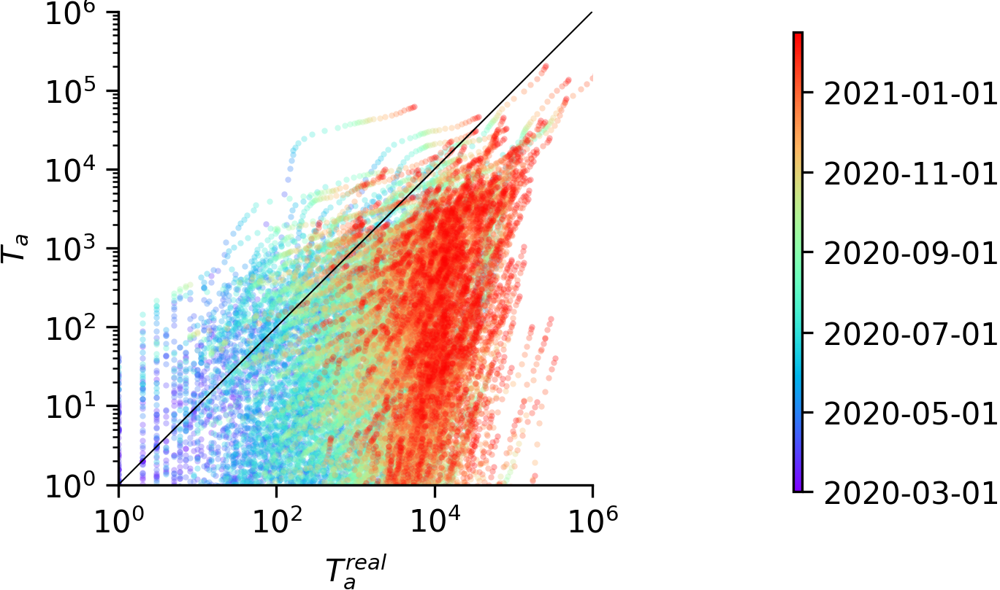

In [51]:
filepath = figdir / (fname + '.png')
Image(filename=filepath, width=4./3*360)

In [52]:
figsize = None
dpi = 300
idump = 10
xlabel = "$T_a^{real}$"
ylabel = "$T_a$"
alpha = 1.
a = 10
vmin = 1.0e0
vmax = 1.0e6

outputdir = figdir / 'distance_trunc' / 'time_T_model_vs_real_sifit'
if not outputdir.is_dir():
    outputdir.mkdir(parents=True, exist_ok=True)

Xs = np.einsum('ta,a->ta', 1-Ss_real, population)
Ys = np.einsum('ta,a->ta', 1-Ss_si_trunc, population)
    
for i in range(len(times)):
    fname = times[i].strftime(tfmt)
    fpaths = [outputdir / (fname + ext) for ext in exts]
    
    plot_scatter(times[i:i+1], Xs[i:i+1], Ys[i:i+1], idump=idump, vmin=vmin,vmax=vmax, alpha=alpha, \
                     xlabel=xlabel, ylabel=ylabel, logscale=True, fpaths=fpaths, dpi=dpi, figsize=figsize, verbose=False)

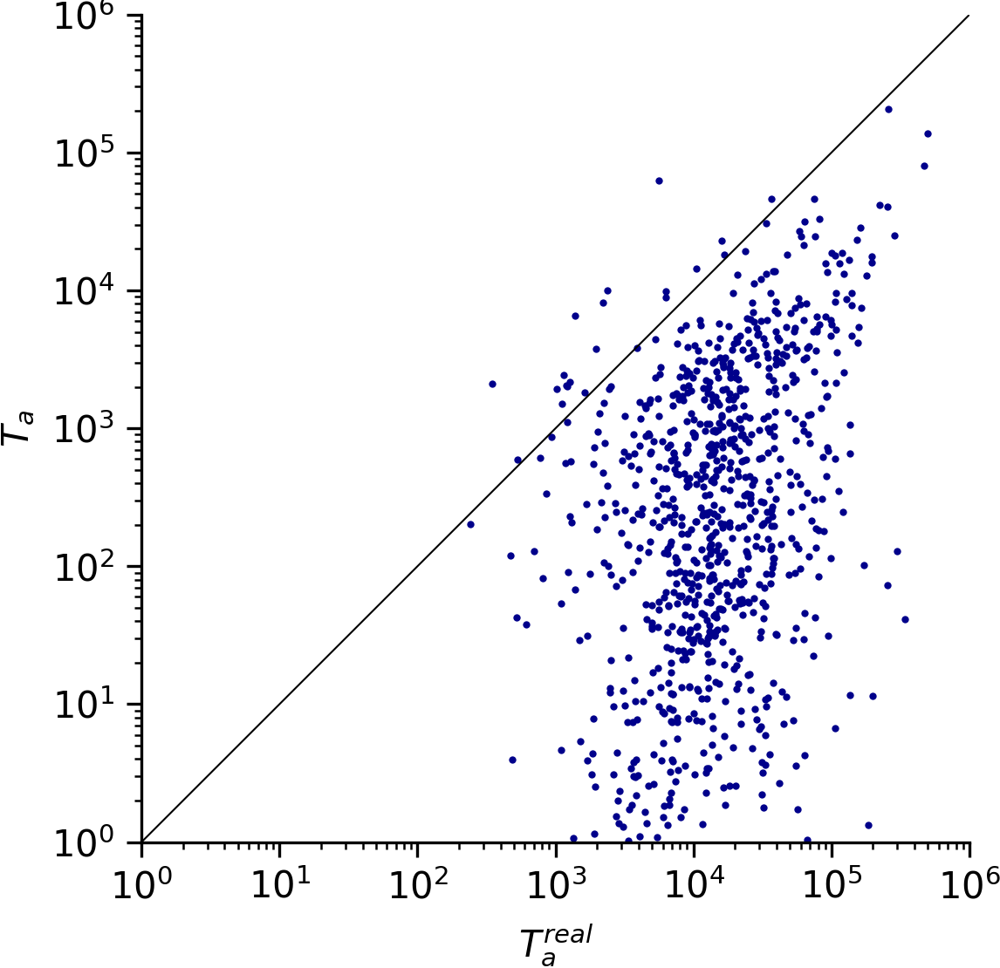

In [53]:
fname = times[i].strftime(tfmt)
filepath = outputdir / (fname + '.png')
Image(filename=filepath, width=4./3*360)

In [54]:
Xs = Vs_real
Ys = Vs_si_trunc
idump = 10
vmin = 1.0e-5
vmax = 2.0e-1
xlabel = "$\\nu_a^{real}$"
ylabel = "$\\nu_a$"
fname = 'nu_model_vs_real_si_trunc'
fpaths = [figdir / (fname + ext) for ext in exts]

plot_scatter(times, Xs, Ys, idump=idump, vmin=vmin,vmax=vmax, \
                 xlabel=xlabel, ylabel=ylabel, logscale=False, fpaths=fpaths)

Written file: ../figures/5-LSQ_fit_scales/nu_model_vs_real_si_trunc.png
Written file: ../figures/5-LSQ_fit_scales/nu_model_vs_real_si_trunc.svg


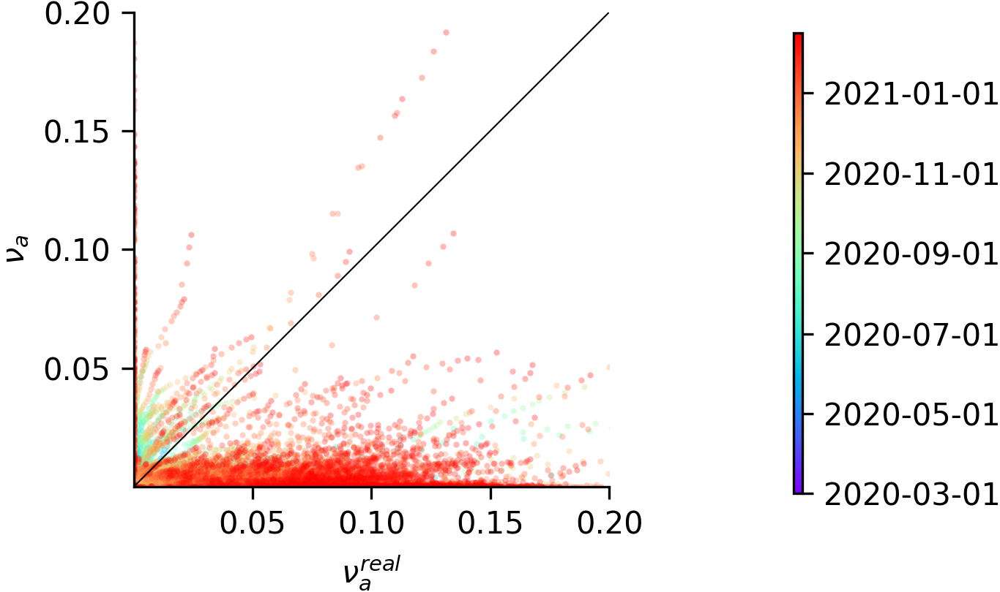

In [55]:
filepath = figdir / (fname + '.png')
Image(filename=filepath, width=4./3*360)

In [56]:
figsize = (4,3)
dpi = 300
idump = 10
# vmin = 1.0e-5
# vmax = 2.0e-1
vmin = None
vmax = None
xlabel = "$\\nu_a^{real}$"
ylabel = "$\\nu_a$"
alpha = 1.
a = 10

outputdir = figdir / 'distance_trunc' / 'time_nu_model_vs_real_sifit'
if not outputdir.is_dir():
    outputdir.mkdir(parents=True, exist_ok=True)

Xs = Vs_real
Ys = Vs_si_trunc
    
for i in range(len(times)):
    fname = times[i].strftime(tfmt)
    fpaths = [outputdir / (fname + ext) for ext in exts]
    
    vmin, vmax = (np.percentile(Ys[i], 0.5*a), np.percentile(Ys[i], (100-0.5*a)))
    plot_scatter(times[i:i+1], Xs[i:i+1], Ys[i:i+1], idump=idump, vmin=vmin,vmax=vmax, alpha=alpha, \
                     xlabel=xlabel, ylabel=ylabel, logscale=False, fpaths=fpaths, dpi=dpi, figsize=figsize, verbose=False)

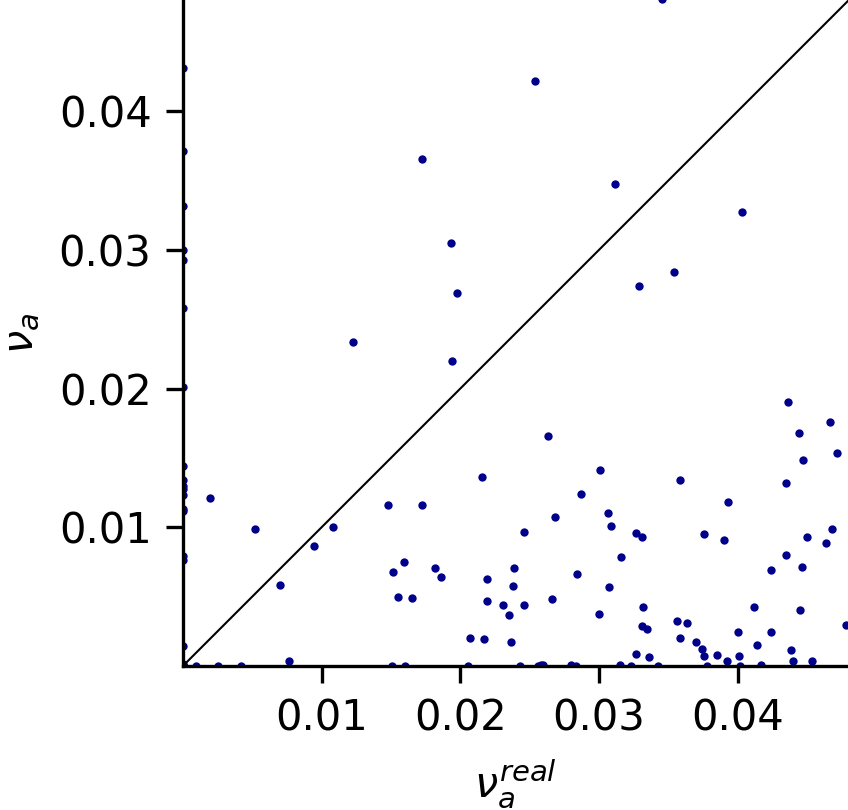

In [57]:
fname = times[i].strftime(tfmt)
filepath = outputdir / (fname + '.png')
Image(filename=filepath, width=4./3*360)

### Additional analysis and plots

In [58]:
Ss_list = np.array([Ss_si_sg, Ss_si_unif, Ss_si_opt, Ss_si_trunc])
Vs_list = np.array([Vs_si_sg, Vs_si_unif, Vs_si_opt, Vs_si_trunc])

#### Some metrics

In [59]:
Z_Ts = np.array([np.einsum('ta,a->ta', Ss - Ss_real, population) for Ss in Ss_list])
sfmt = "T_err:" + "    ".join(["{:.6e}"]*len(Ss_list))
print(sfmt.format(*np.linalg.norm(Z_Ts, axis=(1,2))**2))

T_err:1.663080e+14    1.357936e+14    2.061907e+13    2.130670e+14


In [60]:
sfmt = "T_tot_err:" + "    ".join(["{:.6e}"]*len(Ss_list))
print(sfmt.format(*np.linalg.norm(np.einsum('ita->it', Z_Ts), axis=1)**2))

T_tot_err:4.566990e+15    1.152454e+14    3.123241e+14    3.120860e+16


In [61]:
Z_nus = np.array([Vs - Vs_real for Vs in Vs_list])
sfmt = "Nu_err:" + "    ".join(["{:.6e}"]*len(Ss_list))
print(sfmt.format(*np.linalg.norm(Z_nus, axis=(1,2))**2))

Nu_err:1.139069e+05    1.138210e+05    3.452693e+04    1.144083e+05


#### Scales

In [62]:
scales_list = np.array([scales_si_sg, scales_si_unif, scales_si_opt, scales_si_trunc])

In [63]:
# parameters
figsize = (4,3)
dpi = 300
ms=3
lw=0.5

fig = plt.figure(facecolor='w', figsize=figsize)
ax = fig.gca()

for i in range(len(scales_list)):
    ax.plot(times[:-1], scales_list[i]/np.mean(scales_list[i]), 'o', color=colors[i], mfc='none', ms=ms, mew=lw, label=labels[i])

ax.legend(loc='best', fontsize='medium', frameon=False)
ax.set_xlim(times[0],None)
ax.set_ylim(0.,6)
# ax.set_xlabel("date", fontsize="medium")
ax.set_ylabel("$p \\beta$", fontsize="medium")
plt.xticks(rotation=45)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.tick_params(left=True, labelleft=True, bottom=True, labelbottom=True)
ax.tick_params(axis='both', length=4)
fig.tight_layout()

fname = 'scales_si'
for ext in exts:
    filepath = figdir / (fname + ext)
    fig.savefig(filepath, bbox_inches='tight', pad_inches=0, dpi=dpi)
    print("Written file: {:s}".format(str(filepath)))
fig.clf()
plt.close('all')
# plt.show()

Written file: ../figures/5-LSQ_fit_scales/scales_si.png
Written file: ../figures/5-LSQ_fit_scales/scales_si.svg


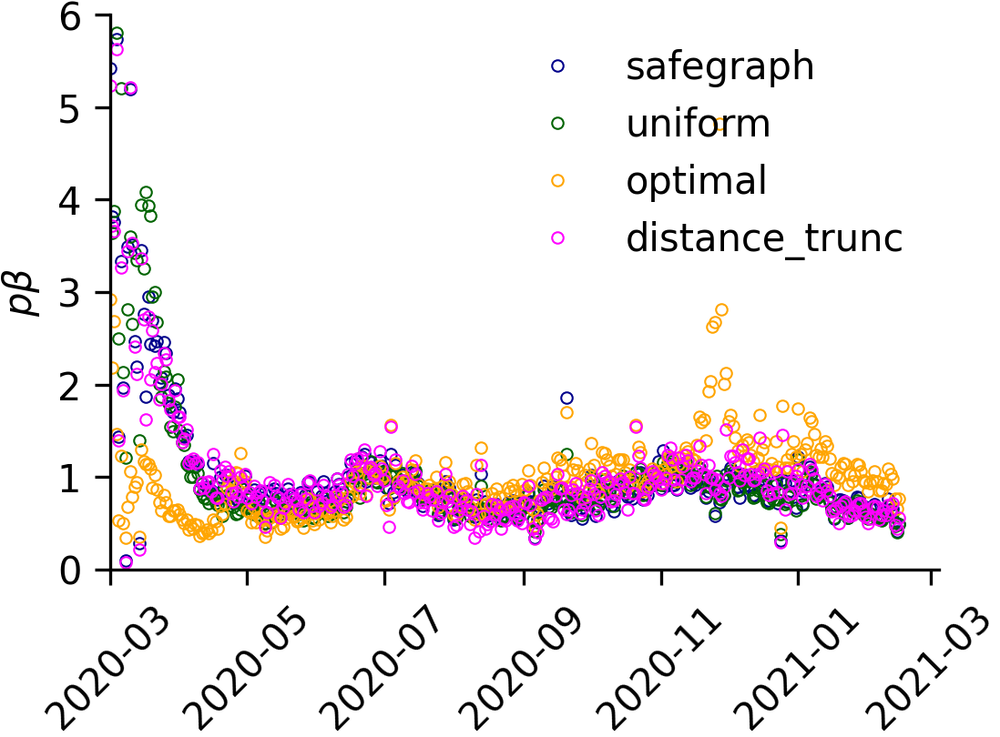

In [64]:
filepath = figdir / (fname + '.png')
Image(filename=filepath, width=4./3*360)

In [65]:
# parameters
figsize = (6,4.5)
dpi = 300
ms=6
lw=1
show_dT=True
n0=None
ptot = np.sum(population) / 1.0e3

fig = plt.figure(facecolor='w', figsize=figsize)
ax = fig.gca()

dT_tot_list = np.array([dT_tot_si_sg, dT_tot_si_unif, dT_tot_si_opt, dT_tot_si_trunc])

if show_dT:
    for i in range(len(dT_tot_list)):
        ax.plot(times[:n0],dT_tot_list[i,:n0]*ptot, '-', ms=ms, lw=lw, color=colors[i], mfc='none', mew=lw, label=labels[i])
    ax.plot(times[:n0],dT_tot_real[:n0]*ptot, 'o', ms=ms, color='red', mfc='none', mew=lw)
    ax.set_ylabel("$d T$ [x1e3]", fontsize="medium")
    fname = 'dT_tot_si'
else:
    for i in range(len(dT_tot_list)):
        ax.plot(times[:n0],T_tot_list[i,:n0]*ptot, '-', ms=ms, lw=lw, color=colors[i], mfc='none', mew=lw, label=labels[i])
    ax.plot(times[:n0],T_tot_real[:n0]*ptot, '-', lw=lw, color='red')
    ax.set_ylabel("$T$ [x1e3]", fontsize="medium")
    ax.set_yscale('log')
    fname = 'T_tot_si'

ax.legend(loc='best', fontsize='medium', frameon=False)
ax.set_xlim(times[0],None)
plt.xticks(rotation=45)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.tick_params(left=True, labelleft=True, bottom=True, labelbottom=True)
ax.tick_params(axis='both', length=4)
fig.tight_layout()

for ext in exts:
    filepath = figdir / (fname + ext)
    fig.savefig(filepath, bbox_inches='tight', pad_inches=0, dpi=dpi)
    print("Written file: {:s}".format(str(filepath)))
fig.clf()
plt.close('all')

Written file: ../figures/5-LSQ_fit_scales/dT_tot_si.png
Written file: ../figures/5-LSQ_fit_scales/dT_tot_si.svg


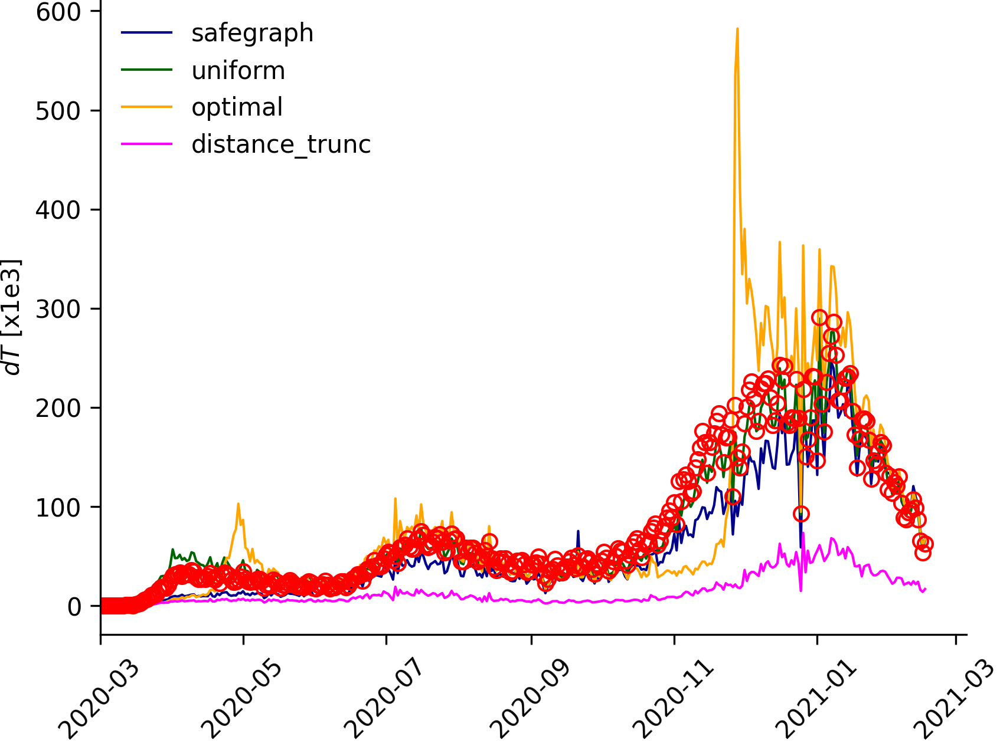

In [66]:
filepath = figdir / (fname + '.png')
Image(filename=filepath, width=4./3*360)

-5497.386604355546 17267.822157061997
nbins = 673    bwidth = 33.82608501952018    a = -5497.305581095059    b = 17267.649637041788


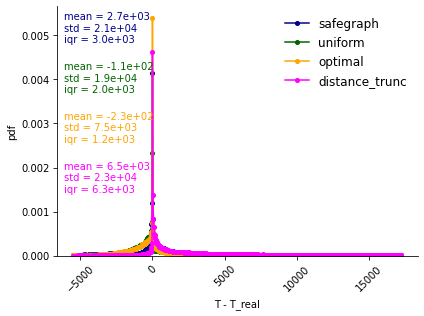

In [67]:
# parameters
figsize = (6,4.5)
dpi = 300
lw=1
ms=4
# bins='doane'
bins='auto'
# bins=2**8
a=10

data = np.array([np.ravel(np.einsum('ta,a->ta', Ss - Ss_real, population)) for Ss in Ss_list])

q1,q2 = np.percentile(data, [a*0.5, 100-a*0.5])
print(q1, q2)
hist, edges = np.histogram(data[~((data < q1) | (data > q2))], bins=bins, density=True)
print("nbins = {}    bwidth = {}    a = {}    b = {}".format(len(edges)-1, edges[1]-edges[0], edges[0], edges[-1]))

hists = []
for dat in data:
    hist, edges = np.histogram(dat, bins=edges, density=True)
    hists.append(hist)

mus = np.mean(data, axis=1)
stds = np.std(data, axis=1)
iqrs = sst.iqr(data, axis=1)

fig = plt.figure(facecolor='w', figsize=figsize)
ax = fig.gca()

X = 0.5*(edges[:-1] + edges[1:])

for i in range(len(data)):
    hist = hists[i]
    ax.plot(X, hist, 'o-', ms=ms, color=colors[i], label=labels[i])
    ax.annotate("mean = {:.1e}\nstd = {:.1e}\niqr = {:.1e}".format(mus[i], stds[i], iqrs[i]), xy=(0.02, 0.98-i*0.2), \
            xycoords="axes fraction", ha="left", va="top", fontsize="medium", color=colors[i])
ax.set_xlabel("T - T_real", fontsize="medium")
ax.set_ylabel("pdf", fontsize="medium")

ax.legend(loc='upper right', fontsize='large', frameon=False)
ax.set_ylim(0.,None)
plt.xticks(rotation=45)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.tick_params(left=True, labelleft=True, bottom=True, labelbottom=True)
ax.tick_params(axis='both', length=4)
fig.tight_layout()
plt.show()
# fname = "kf_errors_pdf"
# for ext in exts:
#     filepath = figdir / (fname + ext)
#     fig.savefig(filepath, bbox_inches='tight', pad_inches=0, dpi=dpi)
#     print("Written file: {:s}".format(str(filepath)))
# fig.clf()
# plt.close('all')

## Integrate the dynamics based on the nu variables

### SafeGraph infectivity matrix

In [68]:
with pd.HDFStore(resfile, complevel=complevel, complib=complib) as store:
    path = Path('/fit') / 'scales' / 'nufit_safegraph' / 'infectivity_matrices'
    mykey = str(path / times[0].strftime(tfmt))
    L_sg = store[mykey].to_numpy().astype('float64')
    
    path = Path('/fit') / 'scales' / 'nufit_safegraph' / 'result'
    mykey = str(path / 'susceptible')
    Ss_nu_sg = store[mykey].to_numpy().astype('float64')
    
    mykey = str(path / 'nu')
    Vs_nu_sg = store[mykey].to_numpy().astype('float64')
    
    mykey = str(path / 'scales')
    scales_nu_sg = store[mykey].to_numpy().astype('float64')

In [69]:
dTs_nu_sg, dT_tot_nu_sg = get_dTs(Ss_nu_sg, population)

In [70]:
Xs = np.einsum('ta,a->ta', 1-Ss_real, population)
Ys = np.einsum('ta,a->ta', 1-Ss_nu_sg, population)
idump = 10
vmin = 1.0e0
vmax = 1.0e6
xlabel = "$T_a^{real}$"
ylabel = "$T_a$"
fname = 'T_model_vs_real_nu_sg'
fpaths = [figdir / (fname + ext) for ext in exts]

plot_scatter(times, Xs, Ys, idump=idump, vmin=vmin,vmax=vmax, \
                 xlabel=xlabel, ylabel=ylabel, logscale=True, fpaths=fpaths)

Written file: ../figures/5-LSQ_fit_scales/T_model_vs_real_nu_sg.png
Written file: ../figures/5-LSQ_fit_scales/T_model_vs_real_nu_sg.svg


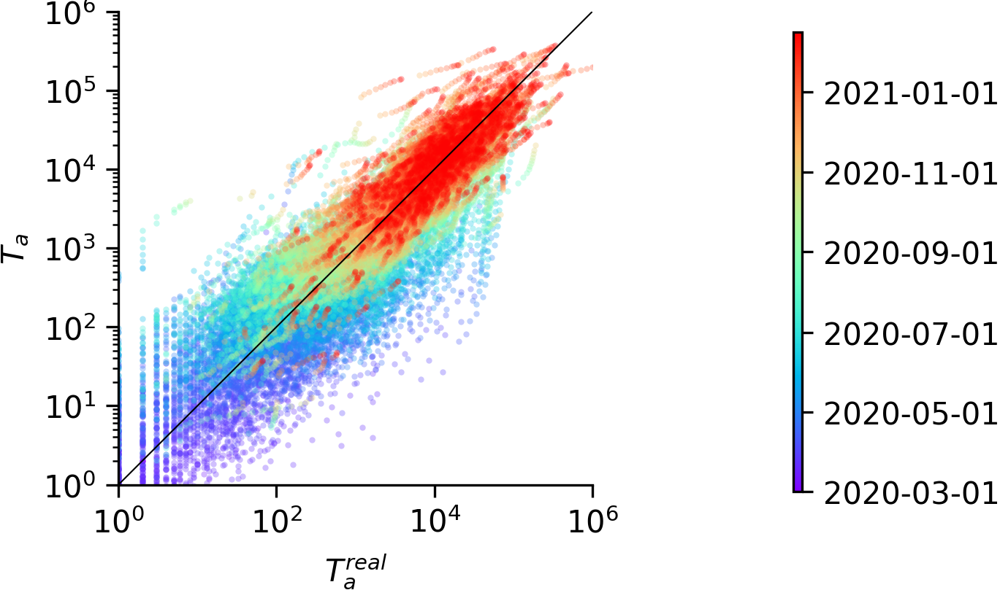

In [71]:
filepath = figdir / (fname + '.png')
Image(filename=filepath, width=4./3*360)

In [72]:
figsize = None
dpi = 300
idump = 10
xlabel = "$T_a^{real}$"
ylabel = "$T_a$"
alpha = 1.
a = 10
vmin = 1.0e0
vmax = 1.0e6

outputdir = figdir / 'safegraph' / 'time_T_model_vs_real_nufit'
if not outputdir.is_dir():
    outputdir.mkdir(parents=True, exist_ok=True)

Xs = np.einsum('ta,a->ta', 1-Ss_real, population)
Ys = np.einsum('ta,a->ta', 1-Ss_nu_sg, population)
    
for i in range(len(times)):
    fname = times[i].strftime(tfmt)
    fpaths = [outputdir / (fname + ext) for ext in exts]
    
    plot_scatter(times[i:i+1], Xs[i:i+1], Ys[i:i+1], idump=idump, vmin=vmin,vmax=vmax, alpha=alpha, \
                     xlabel=xlabel, ylabel=ylabel, logscale=True, fpaths=fpaths, dpi=dpi, figsize=figsize, verbose=False)

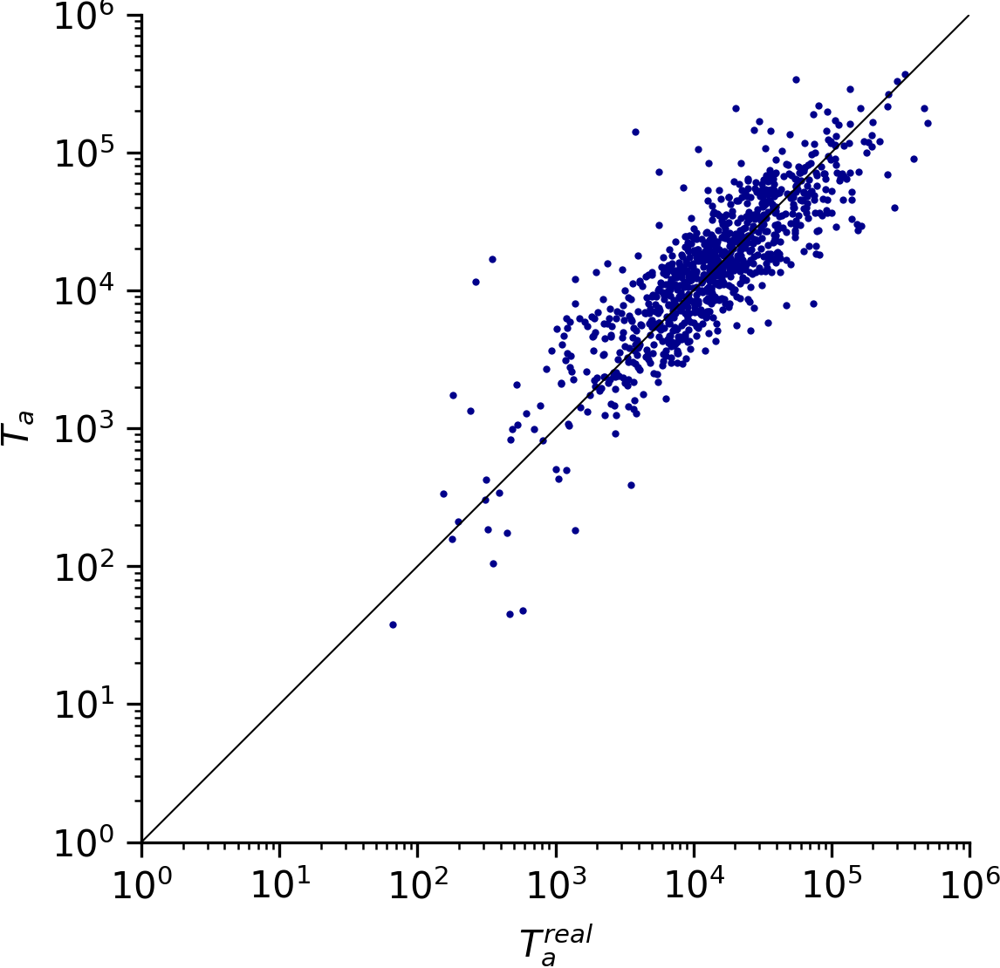

In [73]:
fname = times[i].strftime(tfmt)
filepath = outputdir / (fname + '.png')
Image(filename=filepath, width=4./3*360)

In [74]:
Xs = Vs_real
Ys = Vs_nu_sg
idump = 10
vmin = 1.0e-5
vmax = 2.0e-1
xlabel = "$\\nu_a^{real}$"
ylabel = "$\\nu_a$"
fname = 'nu_model_vs_real_nu_sg'
fpaths = [figdir / (fname + ext) for ext in exts]

plot_scatter(times, Xs, Ys, idump=idump, vmin=vmin,vmax=vmax, \
                 xlabel=xlabel, ylabel=ylabel, logscale=False, fpaths=fpaths)

Written file: ../figures/5-LSQ_fit_scales/nu_model_vs_real_nu_sg.png
Written file: ../figures/5-LSQ_fit_scales/nu_model_vs_real_nu_sg.svg


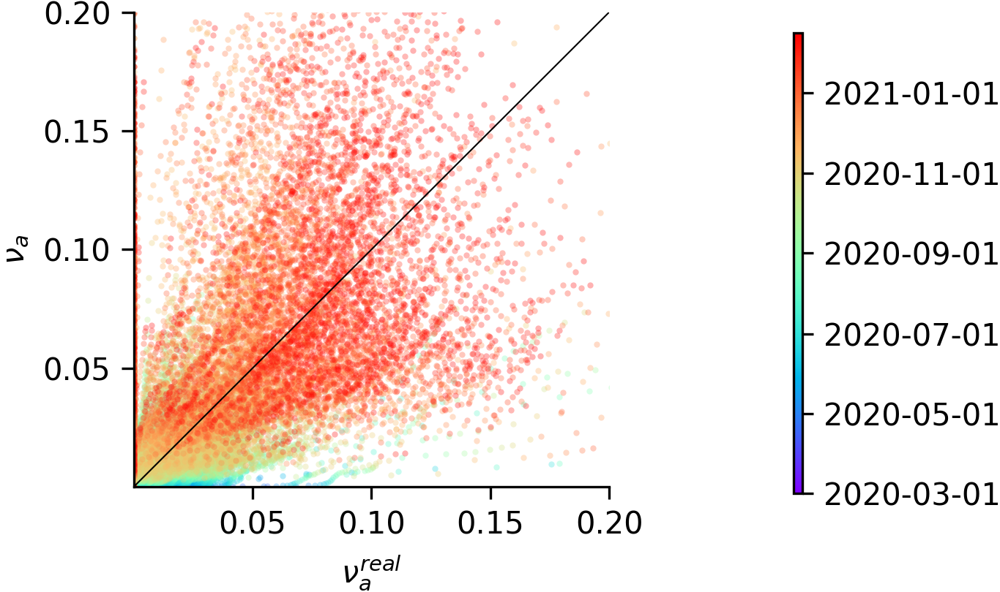

In [75]:
filepath = figdir / (fname + '.png')
Image(filename=filepath, width=4./3*360)

In [76]:
figsize = (4,3)
dpi = 300
idump = 10
# vmin = 1.0e-5
# vmax = 2.0e-1
vmin = None
vmax = None
xlabel = "$\\nu_a^{real}$"
ylabel = "$\\nu_a$"
alpha = 1.
a = 10

outputdir = figdir / 'safegraph' / 'time_nu_model_vs_real_nufit'
if not outputdir.is_dir():
    outputdir.mkdir(parents=True, exist_ok=True)

Xs = Vs_real
Ys = Vs_nu_sg
    
for i in range(len(times)):
    fname = times[i].strftime(tfmt)
    fpaths = [outputdir / (fname + ext) for ext in exts]
    
    vmin, vmax = (np.percentile(Ys[i], 0.5*a), np.percentile(Ys[i], (100-0.5*a)))
    plot_scatter(times[i:i+1], Xs[i:i+1], Ys[i:i+1], idump=idump, vmin=vmin,vmax=vmax, alpha=alpha, \
                     xlabel=xlabel, ylabel=ylabel, logscale=False, fpaths=fpaths, dpi=dpi, figsize=figsize, verbose=False)

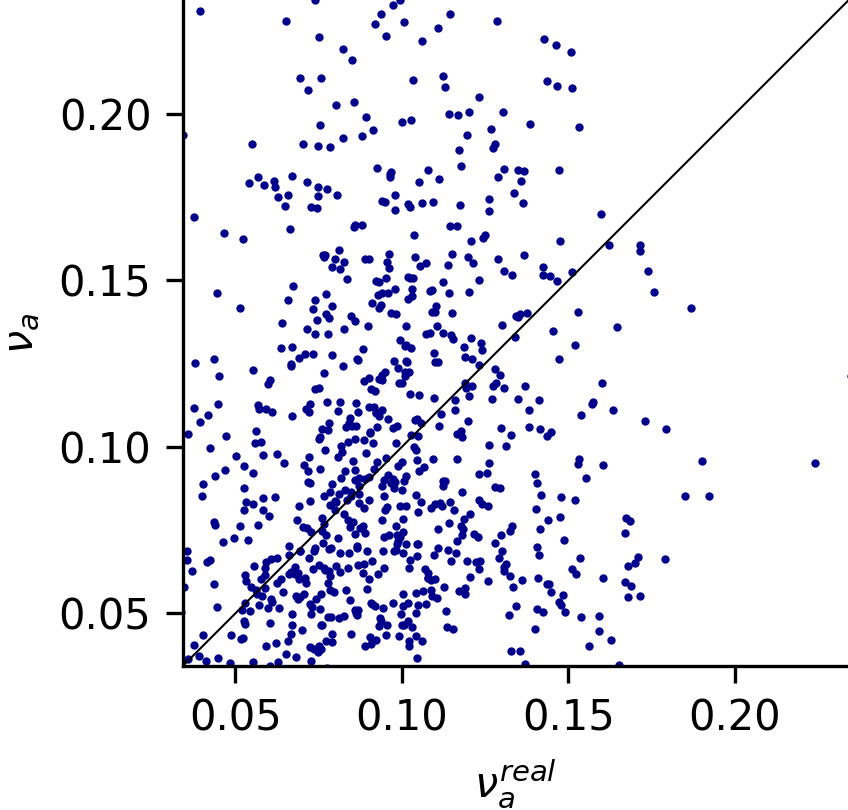

In [77]:
fname = times[i].strftime(tfmt)
filepath = outputdir / (fname + '.png')
Image(filename=filepath, width=4./3*360)

### Uniform infectivity matrix

In [78]:
with pd.HDFStore(resfile, complevel=complevel, complib=complib) as store:
    path = Path('/fit') / 'scales' / 'nufit_uniform' / 'infectivity_matrices'
    mykey = str(path / times[0].strftime(tfmt))
    L_unif = store[mykey].to_numpy().astype('float64')
    
    path = Path('/fit') / 'scales' / 'nufit_uniform' / 'result'
    mykey = str(path / 'susceptible')
    Ss_nu_unif = store[mykey].to_numpy().astype('float64')
    
    mykey = str(path / 'nu')
    Vs_nu_unif = store[mykey].to_numpy().astype('float64')
    
    mykey = str(path / 'scales')
    scales_nu_unif = store[mykey].to_numpy().astype('float64')

In [79]:
dTs_nu_unif, dT_tot_nu_unif = get_dTs(Ss_nu_unif, population)

In [80]:
Xs = np.einsum('ta,a->ta', 1-Ss_real, population)
Ys = np.einsum('ta,a->ta', 1-Ss_nu_unif, population)
# Xs = 1-Ss_real
# Ys = 1-Ss_nu_unif
idump = 10
vmin = 1.0e0
vmax = 1.0e6
# vmin = 1.0e-5
# vmax = None
xlabel = "$T_a^{real}$"
ylabel = "$T_a$"
fname = 'T_model_vs_real_nu_unif'
fpaths = [figdir / (fname + ext) for ext in exts]

plot_scatter(times, Xs, Ys, idump=idump, vmin=vmin,vmax=vmax, \
                 xlabel=xlabel, ylabel=ylabel, logscale=True, fpaths=fpaths)

Written file: ../figures/5-LSQ_fit_scales/T_model_vs_real_nu_unif.png
Written file: ../figures/5-LSQ_fit_scales/T_model_vs_real_nu_unif.svg


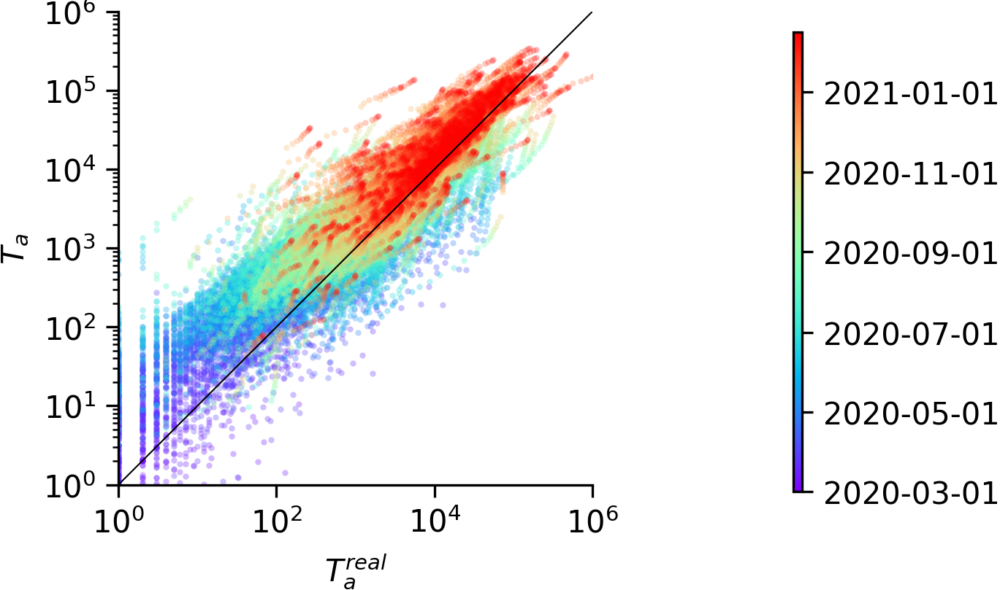

In [81]:
filepath = figdir / (fname + '.png')
Image(filename=filepath, width=4./3*360)

In [82]:
figsize = None
dpi = 300
idump = 10
xlabel = "$T_a^{real}$"
ylabel = "$T_a$"
alpha = 1.
a = 10
vmin = 1.0e0
vmax = 1.0e6

outputdir = figdir / 'uniform' / 'time_T_model_vs_real_nufit'
if not outputdir.is_dir():
    outputdir.mkdir(parents=True, exist_ok=True)

Xs = np.einsum('ta,a->ta', 1-Ss_real, population)
Ys = np.einsum('ta,a->ta', 1-Ss_nu_unif, population)
    
for i in range(len(times)):
    fname = times[i].strftime(tfmt)
    fpaths = [outputdir / (fname + ext) for ext in exts]
    
    plot_scatter(times[i:i+1], Xs[i:i+1], Ys[i:i+1], idump=idump, vmin=vmin,vmax=vmax, alpha=alpha, \
                     xlabel=xlabel, ylabel=ylabel, logscale=True, fpaths=fpaths, dpi=dpi, figsize=figsize, verbose=False)

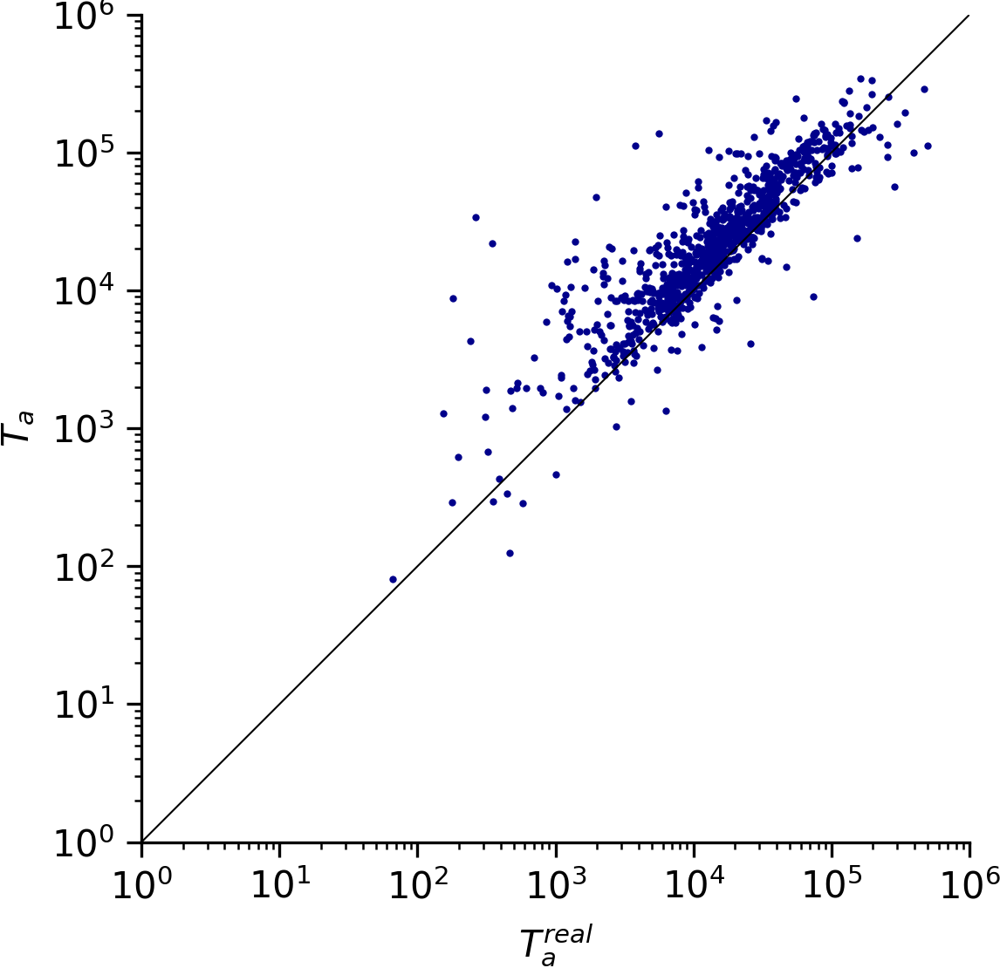

In [83]:
fname = times[i].strftime(tfmt)
filepath = outputdir / (fname + '.png')
Image(filename=filepath, width=4./3*360)

In [84]:
Xs = Vs_real
Ys = Vs_nu_unif
idump = 10
vmin = 1.0e-5
vmax = 2.0e-1
xlabel = "$\\nu_a^{real}$"
ylabel = "$\\nu_a$"
fname = 'nu_model_vs_real_nu_unif'
fpaths = [figdir / (fname + ext) for ext in exts]

plot_scatter(times, Xs, Ys, idump=idump, vmin=vmin,vmax=vmax, \
                 xlabel=xlabel, ylabel=ylabel, logscale=False, fpaths=fpaths)

Written file: ../figures/5-LSQ_fit_scales/nu_model_vs_real_nu_unif.png
Written file: ../figures/5-LSQ_fit_scales/nu_model_vs_real_nu_unif.svg


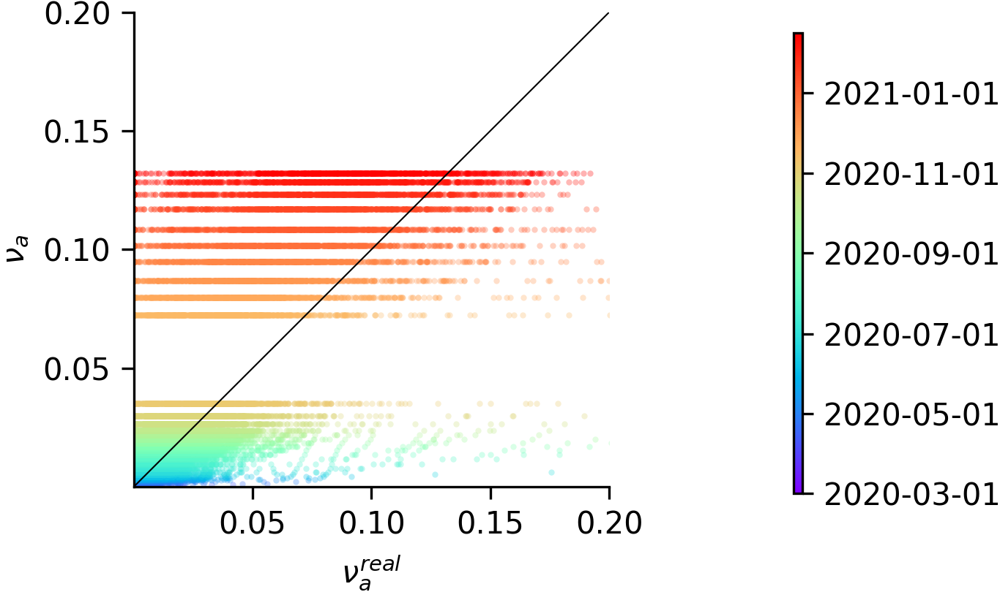

In [85]:
filepath = figdir / (fname + '.png')
Image(filename=filepath, width=4./3*360)

In [86]:
figsize = (4,3)
dpi = 300
idump = 10
# vmin = 1.0e-5
# vmax = 2.0e-1
vmin = None
vmax = None
xlabel = "$\\nu_a^{real}$"
ylabel = "$\\nu_a$"
alpha = 1.
a = 10

outputdir = figdir / 'uniform' / 'time_nu_model_vs_real_nufit'
if not outputdir.is_dir():
    outputdir.mkdir(parents=True, exist_ok=True)

Xs = Vs_real
Ys = Vs_nu_unif
    
for i in range(len(times)):
    fname = times[i].strftime(tfmt)
    fpaths = [outputdir / (fname + ext) for ext in exts]
    
    vmin, vmax = (np.percentile(Ys[i], 0.5*a), np.percentile(Ys[i], (100-0.5*a)))
    plot_scatter(times[i:i+1], Xs[i:i+1], Ys[i:i+1], idump=idump, vmin=vmin,vmax=vmax, alpha=alpha, \
                     xlabel=xlabel, ylabel=ylabel, logscale=False, fpaths=fpaths, dpi=dpi, figsize=figsize, verbose=False)

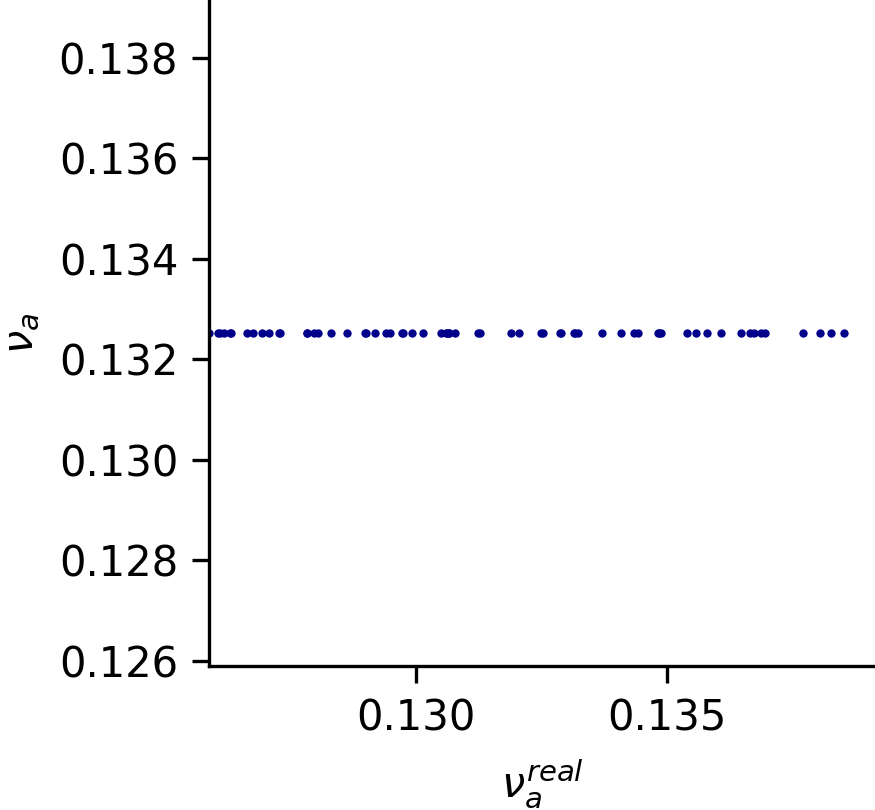

In [87]:
fname = times[i].strftime(tfmt)
filepath = outputdir / (fname + '.png')
Image(filename=filepath, width=4./3*360)

### Optimal infectivity matrix

In [88]:
with pd.HDFStore(resfile, complevel=complevel, complib=complib) as store:
    path = Path('/fit') / 'scales' / 'nufit_optimal' / 'infectivity_matrices'
    mykey = str(path / times[0].strftime(tfmt))
    L_opt = store[mykey].to_numpy().astype('float64')
    
    path = Path('/fit') / 'scales' / 'nufit_optimal' / 'result'
    mykey = str(path / 'susceptible')
    Ss_nu_opt = store[mykey].to_numpy().astype('float64')
    
    mykey = str(path / 'nu')
    Vs_nu_opt = store[mykey].to_numpy().astype('float64')
    
    mykey = str(path / 'scales')
    scales_nu_opt = store[mykey].to_numpy().astype('float64')

In [89]:
dTs_nu_opt, dT_tot_nu_opt = get_dTs(Ss_nu_opt, population)

In [90]:
Xs = np.einsum('ta,a->ta', 1-Ss_real, population)
Ys = np.einsum('ta,a->ta', 1-Ss_nu_opt, population)
idump = 10
vmin = 1.0e0
vmax = 1.0e6
xlabel = "$T_a^{real}$"
ylabel = "$T_a$"
fname = 'T_model_vs_real_nu_opt'
fpaths = [figdir / (fname + ext) for ext in exts]

plot_scatter(times, Xs, Ys, idump=idump, vmin=vmin,vmax=vmax, \
                 xlabel=xlabel, ylabel=ylabel, logscale=True, fpaths=fpaths)

Written file: ../figures/5-LSQ_fit_scales/T_model_vs_real_nu_opt.png
Written file: ../figures/5-LSQ_fit_scales/T_model_vs_real_nu_opt.svg


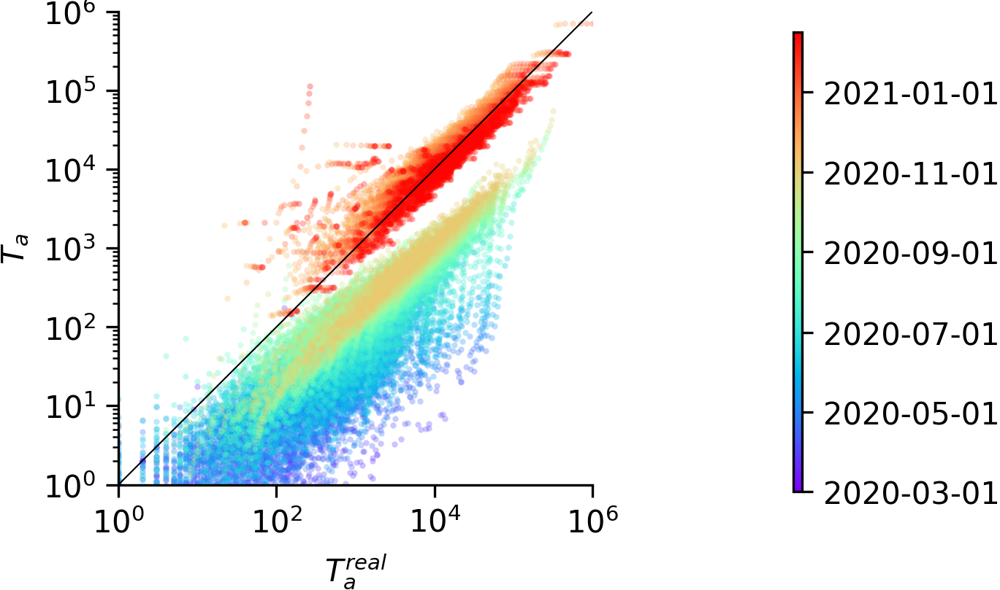

In [91]:
filepath = figdir / (fname + '.png')
Image(filename=filepath, width=4./3*360)

In [92]:
figsize = None
dpi = 300
idump = 10
xlabel = "$T_a^{real}$"
ylabel = "$T_a$"
alpha = 1.
a = 10
vmin = 1.0e0
vmax = 1.0e6

outputdir = figdir / 'optimal' / 'time_T_model_vs_real_nufit'
if not outputdir.is_dir():
    outputdir.mkdir(parents=True, exist_ok=True)

Xs = np.einsum('ta,a->ta', 1-Ss_real, population)
Ys = np.einsum('ta,a->ta', 1-Ss_nu_opt, population)
    
for i in range(len(times)):
    fname = times[i].strftime(tfmt)
    fpaths = [outputdir / (fname + ext) for ext in exts]
    
    plot_scatter(times[i:i+1], Xs[i:i+1], Ys[i:i+1], idump=idump, vmin=vmin,vmax=vmax, alpha=alpha, \
                     xlabel=xlabel, ylabel=ylabel, logscale=True, fpaths=fpaths, dpi=dpi, figsize=figsize, verbose=False)

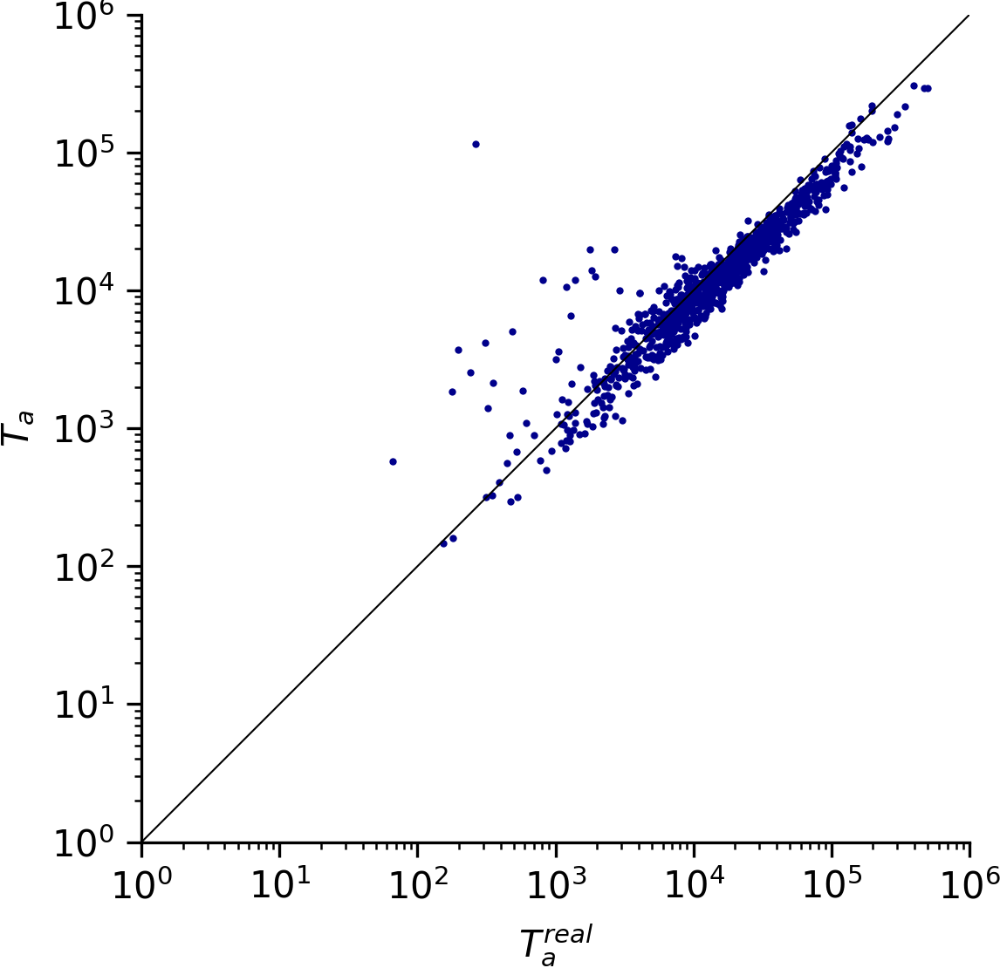

In [93]:
fname = times[i].strftime(tfmt)
filepath = outputdir / (fname + '.png')
Image(filename=filepath, width=4./3*360)

In [94]:
Xs = Vs_real
Ys = Vs_nu_opt
idump = 10
vmin = 1.0e-5
vmax = 2.0e-1
xlabel = "$\\nu_a^{real}$"
ylabel = "$\\nu_a$"
fname = 'nu_model_vs_real_nu_opt'
fpaths = [figdir / (fname + ext) for ext in exts]

plot_scatter(times, Xs, Ys, idump=idump, vmin=vmin,vmax=vmax, \
                 xlabel=xlabel, ylabel=ylabel, logscale=False, fpaths=fpaths)

Written file: ../figures/5-LSQ_fit_scales/nu_model_vs_real_nu_opt.png
Written file: ../figures/5-LSQ_fit_scales/nu_model_vs_real_nu_opt.svg


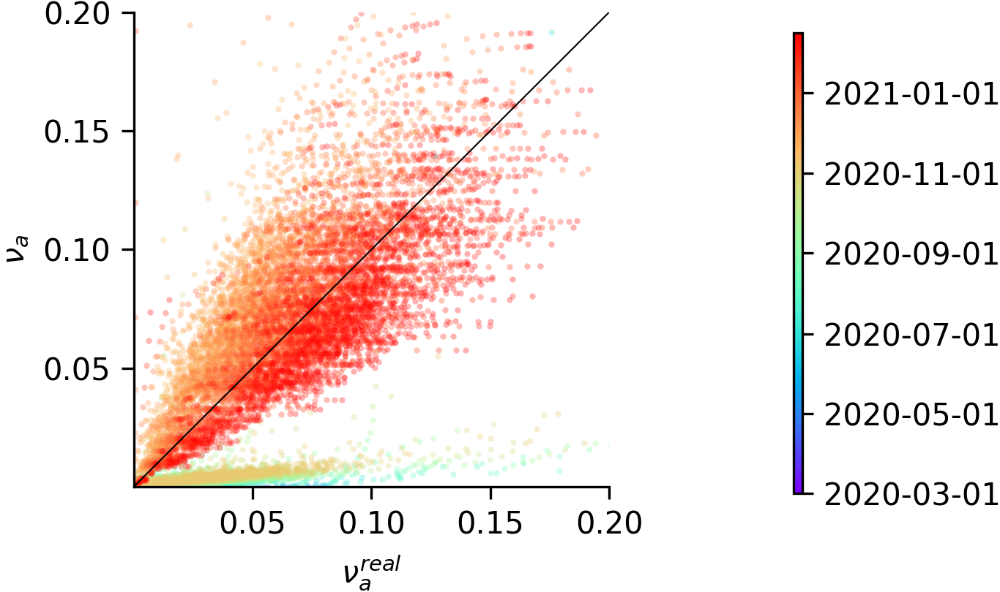

In [95]:
filepath = figdir / (fname + '.png')
Image(filename=filepath, width=4./3*360)

In [96]:
figsize = (4,3)
dpi = 300
idump = 10
# vmin = 1.0e-5
# vmax = 2.0e-1
vmin = None
vmax = None
xlabel = "$\\nu_a^{real}$"
ylabel = "$\\nu_a$"
alpha = 1.
a = 10

outputdir = figdir / 'optimal' / 'time_nu_model_vs_real_nufit'
if not outputdir.is_dir():
    outputdir.mkdir(parents=True, exist_ok=True)

Xs = Vs_real
Ys = Vs_nu_opt
    
for i in range(len(times)):
    fname = times[i].strftime(tfmt)
    fpaths = [outputdir / (fname + ext) for ext in exts]
    
    vmin, vmax = (np.percentile(Ys[i], 0.5*a), np.percentile(Ys[i], (100-0.5*a)))
    plot_scatter(times[i:i+1], Xs[i:i+1], Ys[i:i+1], idump=idump, vmin=vmin,vmax=vmax, alpha=alpha, \
                     xlabel=xlabel, ylabel=ylabel, logscale=False, fpaths=fpaths, dpi=dpi, figsize=figsize, verbose=False)

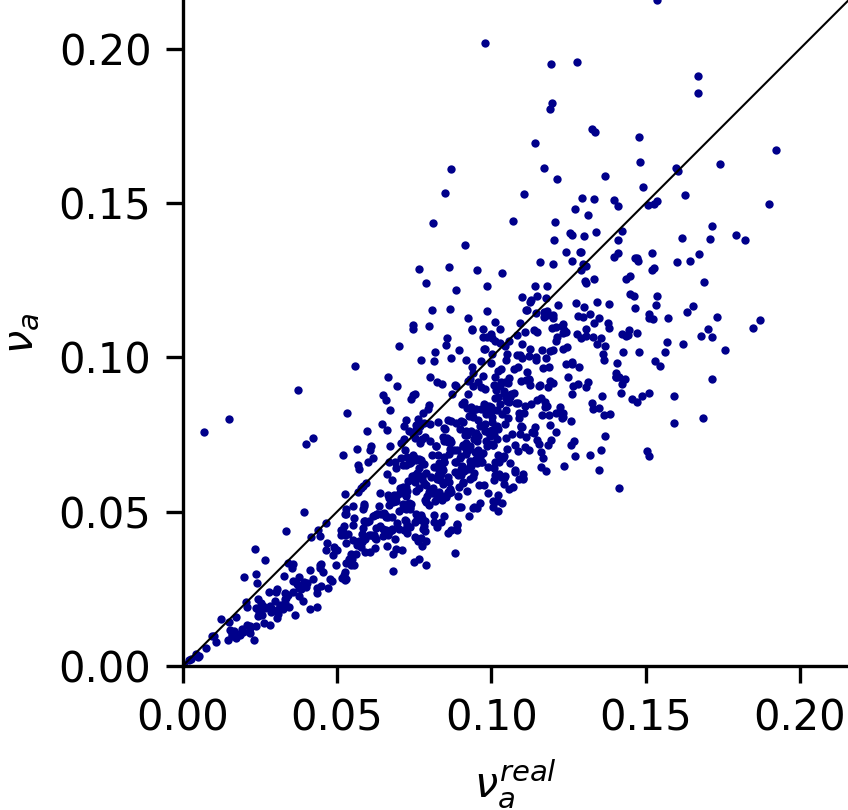

In [97]:
fname = times[i].strftime(tfmt)
filepath = outputdir / (fname + '.png')
Image(filename=filepath, width=4./3*360)

### distance truncated infectivity matrix

In [98]:
with pd.HDFStore(resfile, complevel=complevel, complib=complib) as store:
    path = Path('/fit') / 'scales' / 'nufit_distance_trunc_400km' / 'infectivity_matrices'
    mykey = str(path / times[0].strftime(tfmt))
    L_trunc = store[mykey].to_numpy().astype('float64')
    
    path = Path('/fit') / 'scales' / 'nufit_distance_trunc_400km' / 'result'
    mykey = str(path / 'susceptible')
    Ss_nu_trunc = store[mykey].to_numpy().astype('float64')
    
    mykey = str(path / 'nu')
    Vs_nu_trunc = store[mykey].to_numpy().astype('float64')
    
    mykey = str(path / 'scales')
    scales_nu_trunc = store[mykey].to_numpy().astype('float64')

In [99]:
dTs_nu_trunc, dT_tot_nu_trunc = get_dTs(Ss_nu_trunc, population)

In [100]:
Xs = np.einsum('ta,a->ta', 1-Ss_real, population)
Ys = np.einsum('ta,a->ta', 1-Ss_nu_trunc, population)
idump = 10
vmin = 1.0e0
vmax = 1.0e6
xlabel = "$T_a^{real}$"
ylabel = "$T_a$"
fname = 'T_model_vs_real_nu_trunc'
fpaths = [figdir / (fname + ext) for ext in exts]

plot_scatter(times, Xs, Ys, idump=idump, vmin=vmin,vmax=vmax, \
                 xlabel=xlabel, ylabel=ylabel, logscale=True, fpaths=fpaths)

Written file: ../figures/5-LSQ_fit_scales/T_model_vs_real_nu_trunc.png
Written file: ../figures/5-LSQ_fit_scales/T_model_vs_real_nu_trunc.svg


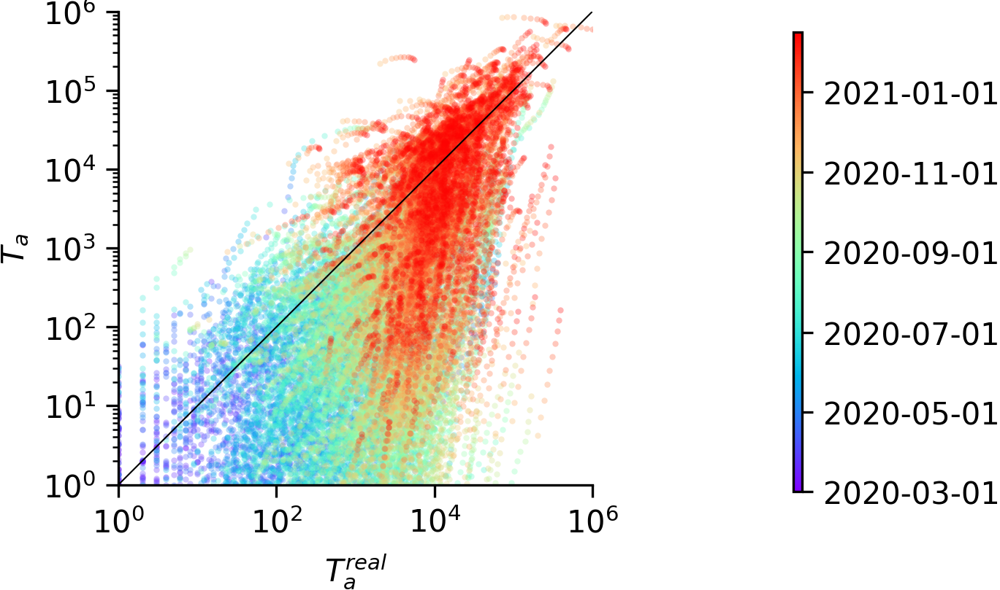

In [101]:
filepath = figdir / (fname + '.png')
Image(filename=filepath, width=4./3*360)

In [102]:
figsize = None
dpi = 300
idump = 10
xlabel = "$T_a^{real}$"
ylabel = "$T_a$"
alpha = 1.
a = 10
vmin = 1.0e0
vmax = 1.0e6

outputdir = figdir / 'distance_trunc' / 'time_T_model_vs_real_nufit'
if not outputdir.is_dir():
    outputdir.mkdir(parents=True, exist_ok=True)

Xs = np.einsum('ta,a->ta', 1-Ss_real, population)
Ys = np.einsum('ta,a->ta', 1-Ss_nu_trunc, population)
    
for i in range(len(times)):
    fname = times[i].strftime(tfmt)
    fpaths = [outputdir / (fname + ext) for ext in exts]
    
    plot_scatter(times[i:i+1], Xs[i:i+1], Ys[i:i+1], idump=idump, vmin=vmin,vmax=vmax, alpha=alpha, \
                     xlabel=xlabel, ylabel=ylabel, logscale=True, fpaths=fpaths, dpi=dpi, figsize=figsize, verbose=False)

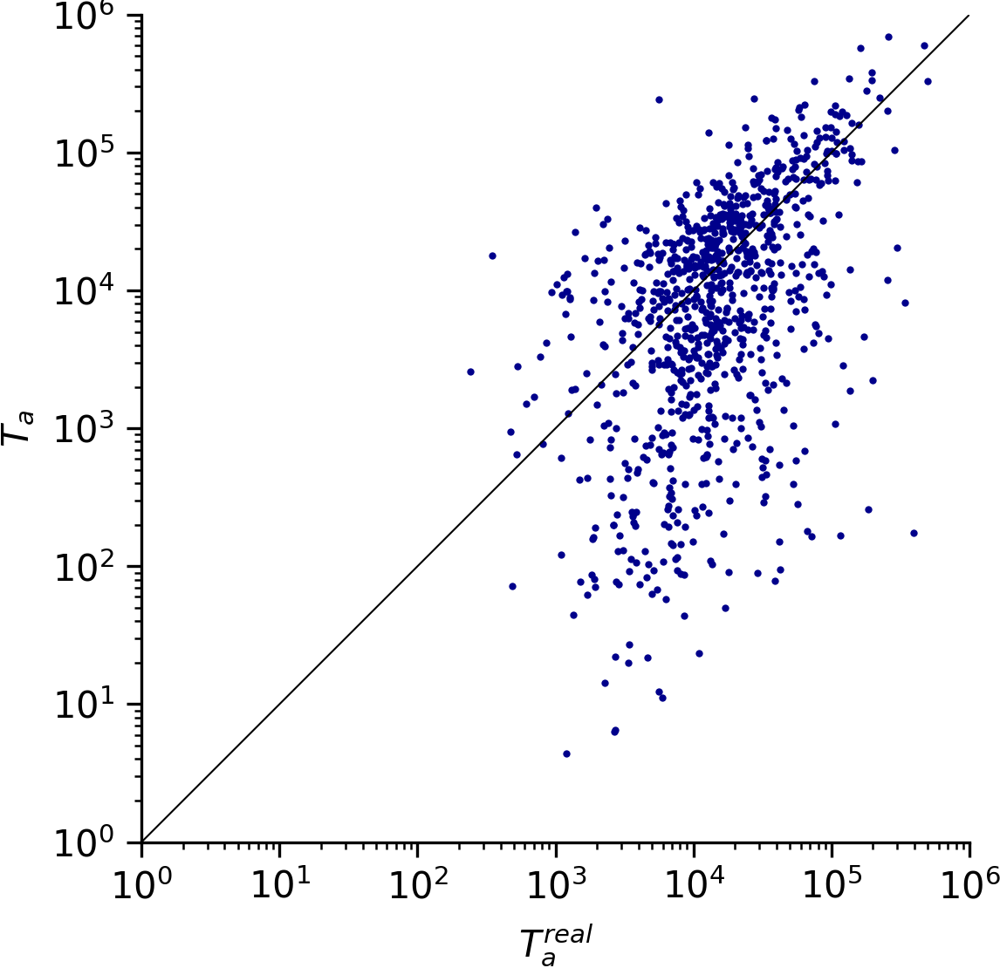

In [103]:
fname = times[i].strftime(tfmt)
filepath = outputdir / (fname + '.png')
Image(filename=filepath, width=4./3*360)

In [104]:
Xs = Vs_real
Ys = Vs_nu_trunc
idump = 10
vmin = 1.0e-5
vmax = 2.0e-1
xlabel = "$\\nu_a^{real}$"
ylabel = "$\\nu_a$"
fname = 'nu_model_vs_real_nu_trunc'
fpaths = [figdir / (fname + ext) for ext in exts]

plot_scatter(times, Xs, Ys, idump=idump, vmin=vmin,vmax=vmax, \
                 xlabel=xlabel, ylabel=ylabel, logscale=False, fpaths=fpaths)

Written file: ../figures/5-LSQ_fit_scales/nu_model_vs_real_nu_trunc.png
Written file: ../figures/5-LSQ_fit_scales/nu_model_vs_real_nu_trunc.svg


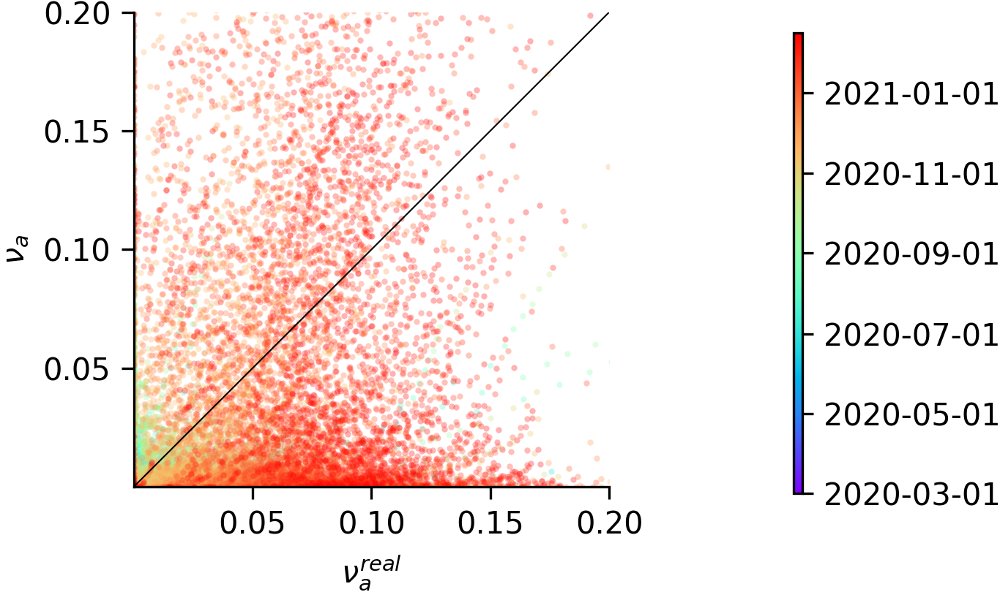

In [105]:
filepath = figdir / (fname + '.png')
Image(filename=filepath, width=4./3*360)

In [106]:
figsize = (4,3)
dpi = 300
idump = 10
# vmin = 1.0e-5
# vmax = 2.0e-1
vmin = None
vmax = None
xlabel = "$\\nu_a^{real}$"
ylabel = "$\\nu_a$"
alpha = 1.
a = 10

outputdir = figdir / 'distance_trunc' / 'time_nu_model_vs_real_nufit'
if not outputdir.is_dir():
    outputdir.mkdir(parents=True, exist_ok=True)

Xs = Vs_real
Ys = Vs_nu_trunc
    
for i in range(len(times)):
    fname = times[i].strftime(tfmt)
    fpaths = [outputdir / (fname + ext) for ext in exts]
    
    vmin, vmax = (np.percentile(Ys[i], 0.5*a), np.percentile(Ys[i], (100-0.5*a)))
    plot_scatter(times[i:i+1], Xs[i:i+1], Ys[i:i+1], idump=idump, vmin=vmin,vmax=vmax, alpha=alpha, \
                     xlabel=xlabel, ylabel=ylabel, logscale=False, fpaths=fpaths, dpi=dpi, figsize=figsize, verbose=False)

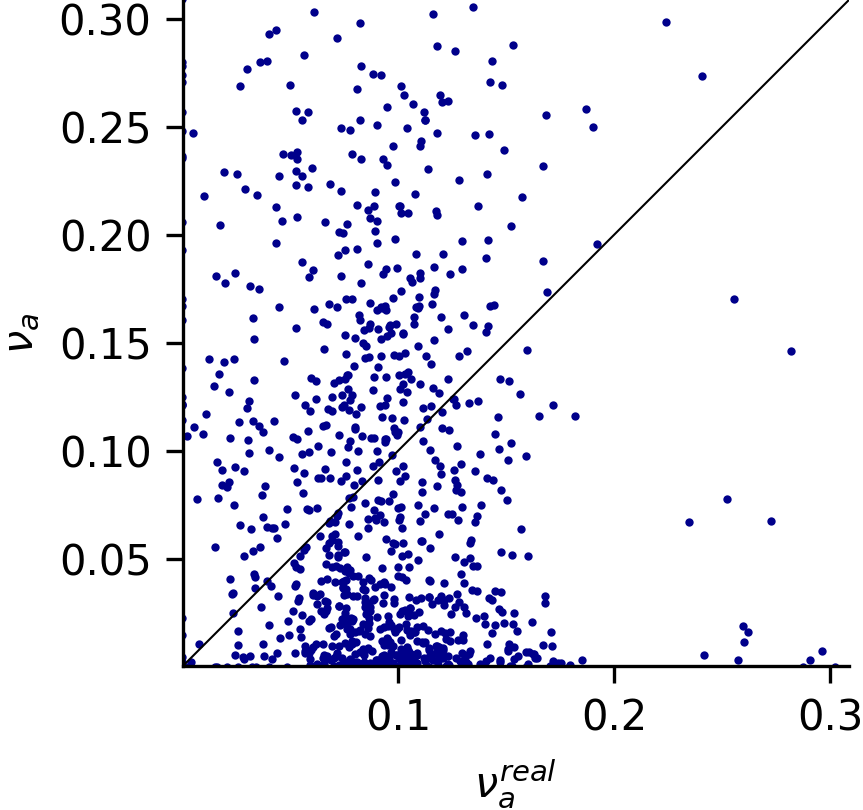

In [107]:
fname = times[i].strftime(tfmt)
filepath = outputdir / (fname + '.png')
Image(filename=filepath, width=4./3*360)

### Additional analysis and plots

In [108]:
Ss_list = np.array([Ss_nu_sg, Ss_nu_unif, Ss_nu_opt, Ss_nu_trunc])
Vs_list = np.array([Vs_nu_sg, Vs_nu_unif, Vs_nu_opt, Vs_nu_trunc])

#### Some metrics

In [109]:
Z_Ts = np.array([np.einsum('ta,a->ta', Ss - Ss_real, population) for Ss in Ss_list])
sfmt = "T_err:" + "    ".join(["{:.6e}"]*len(Ss_list))
print(sfmt.format(*np.linalg.norm(Z_Ts, axis=(1,2))**2))

T_err:2.023187e+14    1.742017e+14    5.460854e+13    6.593392e+14


In [110]:
sfmt = "T_tot_err:" + "    ".join(["{:.6e}"]*len(Ss_list))
print(sfmt.format(*np.linalg.norm(np.einsum('ita->it', Z_Ts), axis=1)**2))

T_tot_err:2.919351e+15    1.438657e+16    7.103002e+15    1.157874e+16


In [111]:
Z_nus = np.array([Vs - Vs_real for Vs in Vs_list])
sfmt = "Nu_err:" + "    ".join(["{:.6e}"]*len(Ss_list))
print(sfmt.format(*np.linalg.norm(Z_nus, axis=(1,2))**2))

Nu_err:1.137519e+05    1.136312e+05    6.029282e+03    1.129382e+05


#### Scales

In [112]:
scales_list = np.array([scales_nu_sg, scales_nu_unif, scales_nu_opt, scales_nu_trunc])

In [113]:
# parameters
figsize = (4,3)
dpi = 300
ms=3
lw=0.5

fig = plt.figure(facecolor='w', figsize=figsize)
ax = fig.gca()

for i in range(len(scales_list)):
    ax.plot(times[:-1], scales_list[i]/np.mean(scales_list[i]), 'o', color=colors[i], mfc='none', ms=ms, mew=lw, label=labels[i])

ax.legend(loc='best', fontsize='medium', frameon=False)
ax.set_xlim(times[0],None)
ax.set_ylim(0.,5)
# ax.set_xlabel("date", fontsize="medium")
ax.set_ylabel("$p \\beta$", fontsize="medium")
plt.xticks(rotation=45)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.tick_params(left=True, labelleft=True, bottom=True, labelbottom=True)
ax.tick_params(axis='both', length=4)
fig.tight_layout()

fname = 'scales_nu'
for ext in exts:
    filepath = figdir / (fname + ext)
    fig.savefig(filepath, bbox_inches='tight', pad_inches=0, dpi=dpi)
    print("Written file: {:s}".format(str(filepath)))
fig.clf()
plt.close('all')
# plt.show()

Written file: ../figures/5-LSQ_fit_scales/scales_nu.png
Written file: ../figures/5-LSQ_fit_scales/scales_nu.svg


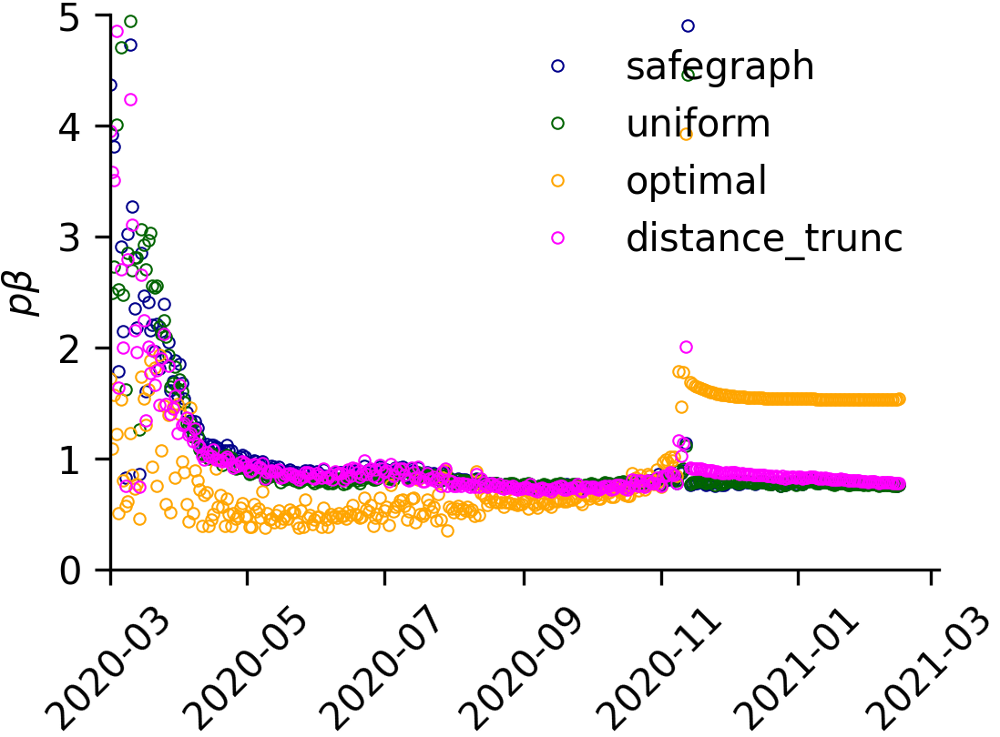

In [114]:
filepath = figdir / (fname + '.png')
Image(filename=filepath, width=4./3*360)

In [115]:
dT_tot_list = np.array([dT_tot_nu_sg, dT_tot_nu_unif, dT_tot_nu_opt, dT_tot_nu_trunc])

In [116]:
# parameters
figsize = (6,4.5)
dpi = 300
ms=6
lw=1
show_dT=True
n0=None
ptot = np.sum(population) / 1.0e3

fig = plt.figure(facecolor='w', figsize=figsize)
ax = fig.gca()

if show_dT:
    for i in range(len(dT_tot_list)):
        ax.plot(times[:n0],dT_tot_list[i,:n0]*ptot, '-', ms=ms, lw=lw, color=colors[i], mfc='none', mew=lw, label=labels[i])
    ax.plot(times[:n0],dT_tot_real[:n0]*ptot, 'o', ms=ms, color='red', mfc='none', mew=lw)
    ax.set_ylabel("$d T$ [x1e3]", fontsize="medium")
    fname = 'dT_tot_nu'
else:
    for i in range(len(dT_tot_list)):
        ax.plot(times[:n0],T_tot_list[i,:n0]*ptot, '-', ms=ms, lw=lw, color=colors[i], mfc='none', mew=lw, label=labels[i])
    ax.plot(times[:n0],T_tot_real[:n0]*ptot, '-', lw=lw, color='red')
    ax.set_ylabel("$T$ [x1e3]", fontsize="medium")
    ax.set_yscale('log')
    fname = 'T_tot_nu'

ax.legend(loc='best', fontsize='medium', frameon=False)
ax.set_xlim(times[0],None)
ax.set_ylim(0., 300)
plt.xticks(rotation=45)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.tick_params(left=True, labelleft=True, bottom=True, labelbottom=True)
ax.tick_params(axis='both', length=4)
fig.tight_layout()

for ext in exts:
    filepath = figdir / (fname + ext)
    fig.savefig(filepath, bbox_inches='tight', pad_inches=0, dpi=dpi)
    print("Written file: {:s}".format(str(filepath)))
fig.clf()
plt.close('all')

Written file: ../figures/5-LSQ_fit_scales/dT_tot_nu.png
Written file: ../figures/5-LSQ_fit_scales/dT_tot_nu.svg


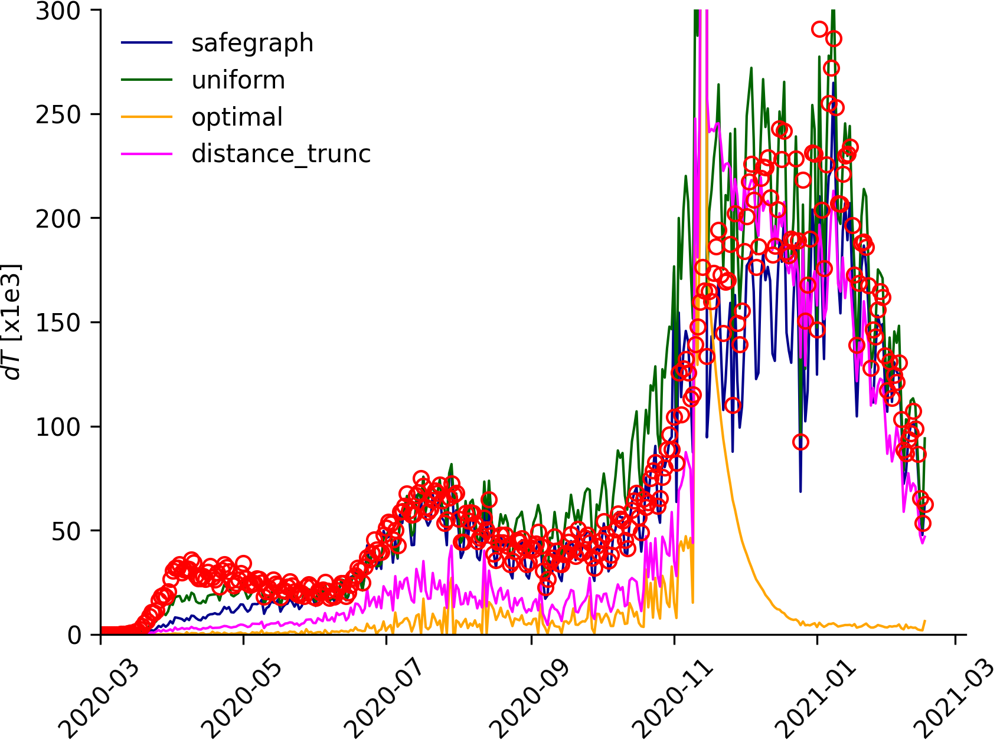

In [117]:
filepath = figdir / (fname + '.png')
Image(filename=filepath, width=4./3*360)

-0.046112322137801566 0.058645247630028846
nbins = 592    bwidth = 0.00017695511722670004    a = -0.046112273608082524    b = 0.05864515579012572


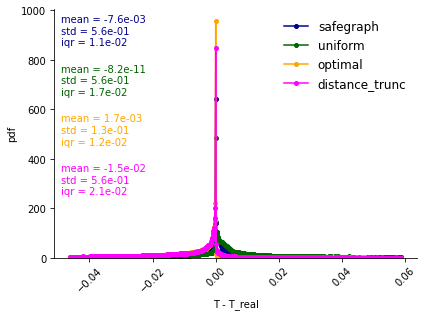

In [118]:
# parameters
figsize = (6,4.5)
dpi = 300
lw=1
ms=4
# bins='doane'
bins='auto'
# bins=2**8
a=10

data = np.array([np.ravel(Vs - Vs_real) for Vs in Vs_list])

q1,q2 = np.percentile(data, [a*0.5, 100-a*0.5])
print(q1, q2)
hist, edges = np.histogram(data[~((data < q1) | (data > q2))], bins=bins, density=True)
print("nbins = {}    bwidth = {}    a = {}    b = {}".format(len(edges)-1, edges[1]-edges[0], edges[0], edges[-1]))

hists = []
for dat in data:
    hist, edges = np.histogram(dat, bins=edges, density=True)
    hists.append(hist)

mus = np.mean(data, axis=1)
stds = np.std(data, axis=1)
iqrs = sst.iqr(data, axis=1)

fig = plt.figure(facecolor='w', figsize=figsize)
ax = fig.gca()

X = 0.5*(edges[:-1] + edges[1:])

for i in range(len(data)):
    hist = hists[i]
    ax.plot(X, hist, 'o-', ms=ms, color=colors[i], label=labels[i])
    ax.annotate("mean = {:.1e}\nstd = {:.1e}\niqr = {:.1e}".format(mus[i], stds[i], iqrs[i]), xy=(0.02, 0.98-i*0.2), \
            xycoords="axes fraction", ha="left", va="top", fontsize="medium", color=colors[i])
ax.set_xlabel("T - T_real", fontsize="medium")
ax.set_ylabel("pdf", fontsize="medium")

ax.legend(loc='upper right', fontsize='large', frameon=False)
ax.set_ylim(0.,None)
plt.xticks(rotation=45)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.tick_params(left=True, labelleft=True, bottom=True, labelbottom=True)
ax.tick_params(axis='both', length=4)
fig.tight_layout()
plt.show()
# fname = "kf_errors_pdf"
# for ext in exts:
#     filepath = figdir / (fname + ext)
#     fig.savefig(filepath, bbox_inches='tight', pad_inches=0, dpi=dpi)
#     print("Written file: {:s}".format(str(filepath)))
# fig.clf()
# plt.close('all')